In [1]:
import pandas as pd
from astropy.io import fits
import numpy as np
import matplotlib.pyplot as plt
import random
from scipy.optimize import curve_fit
from astropy.timeseries import LombScargle
import os
from matplotlib.backends.backend_pdf import PdfPages

In [36]:
archivo = fits.open('TCampob278.fits') #Campo Completo
archivo1 = fits.open('PVariablesb278.fits') #Primera muestra sobre el polinomio 103 en total
archivo2=fits.open('PVariablesb2783.fits') #Primera muestra debajo el polinomio 871 en total - Tercera muestra de entrenamiento 
archivo3=fits.open('PVariablesb2782.fits') #Segunda muestra de entrenamiento debajo del polinomio 857
archivo4 = fits.open('PVaribales_2b278.fits')
HJD78=archivo[1].data
Ks1_78=archivo1[3].data      #Primera muestra sobre el polinomio 103 en total
Ks2_78=archivo2[10].data      #Primera muestra debajo el polinomio 871 en total
Ks3_78=archivo3[3].data      #Segunda muestra debajo del polinomio 857
Ks4_78=archivo4[5].data      #segunda muestra sobre el polinomio 111
Ks5_78=archivo2[6].data      #Tercera muestra 854 en total

archivo5 = fits.open('TCampo_b279.fits') #Campo Completo
archivo6=fits.open('PVariablesb2792.fits') #Segunda muestra de entrenamiento debajo del polinomio 857
archivo7 = fits.open('PVariablesb2793.fits')
HJD79=archivo5[1].data
Ks6_79=archivo7[5].data      #Primera muestra sobre el polinomio 745 en total
Ks7_79=archivo6[3].data      #Primera muestra debajo el polinomio 701 en total
Ks8_79=archivo7[3].data      #Segunda muestra debajo del polinomio 721
archivo7.info()

Filename: PVariablesb2793.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU       4   ()      
  1  KS_ALE        1 ImageHDU         8   (68, 100000)   float64   
  2  EKS_ALE       1 ImageHDU         8   (68, 100000)   float64   
  3  KS_PV         1 ImageHDU         8   (68, 701)   float64   
  4  EKS_PV        1 ImageHDU         8   (68, 701)   float64   
  5  1KS_PV        1 ImageHDU         8   (68, 745)   float64   
  6  1EKS_PV       1 ImageHDU         8   (68, 745)   float64   


In [16]:
# Leer el primer archivo y cargar los datos en un DataFrame
d1_v = pd.read_csv('REV.CC.AG.BIN.txt', header=None, delim_whitespace=True)
print(d1_v)

                    0          1             2       3       4     5    6  \
0   Datos3b279335.txt  30.023038  55309.758970  12.486  12.765  Misc  0.0   
1   Datos3b279344.txt  33.425084  55309.758970  12.795  13.053  Misc  0.0   
2   Datos3b279417.txt   0.962840  55309.758970  14.436  14.877  Misc  0.0   
3   Datos3b279111.txt   3.862689  55309.758970  14.450  14.853  Misc  0.0   
4     Datos3b2791.txt   2.527718  55309.758970  13.880  14.204  Misc  0.0   
5   Datos3b279490.txt   2.794258  55309.758970  14.503  14.962  Misc  0.0   
6   Datos3b279615.txt   2.768260  55309.758970  14.233  14.865  Misc  0.0   
7   Datos3b279521.txt   2.278724  55309.758970  12.784  13.128  Misc  0.0   
8   Datos3b279168.txt   3.275172  55309.758970  14.496  15.223  Misc  0.0   
9   Datos3b279635.txt   3.139186  55309.758970  14.216  14.652  Misc  0.0   
10  Datos3b279687.txt   0.829240  55309.758970  13.414  13.785  Misc  0.0   
11  Datos3b279499.txt   0.626690  55309.758970  12.798  13.094  Misc  0.0   

In [39]:
# Leer el primer archivo y cargar los datos en un DataFrame
d2_v = pd.read_csv('REV.CC.AG.CEF.txt', header=None, delim_whitespace=True)
print(d2_v)

                    0          1             2       3       4     5    6    7
0    Datos3b27923.txt   1.661847  55309.758970  15.389  16.045  Misc  0.0  0.0
1   Datos3b279218.txt   9.041527  55309.758970  12.798  13.158  Misc  0.0  0.0
2   Datos3b279573.txt   4.605205  55309.758970  13.761  14.069  Misc  0.0  0.0
3   Datos3b279428.txt   1.200840  55309.758970  13.009  13.239  Misc  0.0  0.0
4    Datos3b27933.txt   3.620656  55309.758970  13.355  13.565  Misc  0.0  0.0
..                ...        ...           ...     ...     ...   ...  ...  ...
75  Datos1b278551.txt   4.609455  55820.561995  13.098  13.649  Misc  0.0  0.0
76  Datos1b278660.txt  13.151165  55820.561995  13.188  13.394  Misc  0.0  0.0
77  Datos1b278849.txt   2.840818  55820.561995  12.331  12.754  Misc  0.0  0.0
78  Datos1b278388.txt   1.233701  55820.561995  12.627  12.921  Misc  0.0  0.0
79  Datos1b278147.txt   1.267378  55820.561995  15.062  15.715  Misc  0.0  0.0

[80 rows x 8 columns]


In [51]:
# Leer el primer archivo y cargar los datos en un DataFrame
d3_v = pd.read_csv('REV.CC.AG.RRLYR.txt', header=None, delim_whitespace=True)
print(d3_v)

                     0         1             2       3       4     5    6    7
0    Datos3b279297.txt  0.516343  55309.758970  15.036  15.423  Misc  0.0  0.0
1    Datos3b279596.txt  0.489556  55309.758970  13.652  13.971  Misc  0.0  0.0
2    Datos3b279398.txt  0.182416  55309.758970  14.467  14.803  Misc  0.0  0.0
3      Datos3b2795.txt  0.635638  55309.758970  14.542  14.821  Misc  0.0  0.0
4    Datos3b279185.txt  0.509337  55309.758970  14.140  14.441  Misc  0.0  0.0
..                 ...       ...           ...     ...     ...   ...  ...  ...
280  Datos1b278727.txt  0.644397  55820.561995  15.190  15.706  Misc  0.0  0.0
281  Datos1b278492.txt  0.441780  55820.561995  13.842  14.127  Misc  0.0  0.0
282   Datos1b27860.txt  0.211802  55820.561995  13.996  14.475  Misc  0.0  0.0
283  Datos1b278833.txt  0.567471  55820.561995  13.235  13.504  Misc  0.0  0.0
284  Datos1b278611.txt  0.402933  55820.561995  13.392  13.623  Misc  0.0  0.0

[285 rows x 8 columns]


In [54]:
# Leer el primer archivo y cargar los datos en un DataFrame
d4_v = pd.read_csv('REV.CC.AG.RECHAZADO.txt', header=None, delim_whitespace=True)
print(d4_v)

                     0         1             2       3       4     5    6    7
0    Datos3b279552.txt  0.992350  55309.758970  13.867  14.084  Misc  0.0  0.0
1    Datos3b279396.txt  2.413319  55309.758970  16.001  16.684  Misc  0.0  0.0
2    Datos3b279568.txt  0.417723  55309.758970  15.581  16.117  Misc  0.0  0.0
3    Datos3b279525.txt  0.414771  55309.758970  15.911  16.456  Misc  0.0  0.0
4    Datos3b279385.txt  0.438983  55309.758970  14.212  14.568  Misc  0.0  0.0
..                 ...       ...           ...     ...     ...   ...  ...  ...
123  Datos1b278687.txt  0.328776  55820.561995  15.919  16.631  Misc  0.0  0.0
124  Datos1b278264.txt  0.280730  55820.561995  15.460  15.909  Misc  0.0  0.0
125  Datos1b278403.txt  0.567463  55820.561995  13.235  13.504  Misc  0.0  0.0
126   Datos1b27895.txt  0.286981  55820.561995  13.392  13.623  Misc  0.0  0.0
127  Datos1b278611.txt  0.286980  55820.561995  13.392  13.623  Misc  0.0  0.0

[128 rows x 8 columns]


In [37]:
def data (inicio:str, Ks:np.array, nombre:str):
    variables=d1_v[0].tolist()
    periodos=d1_v[1].tolist()
    Datos1={}
    V1=[]
    for i, elemento in enumerate(variables):
        nombre_sin_extension = os.path.splitext(elemento)[0]  # Eliminar la extensión ".txt"
        if nombre_sin_extension.startswith(inicio):
            # Obtener el número final del nombre
            numero = int(nombre_sin_extension[len(inicio):])
            Datos1[nombre+str(numero)] = [periodos[i], Ks[numero]]
            V1.append(Ks[numero])
    return Datos1, V1

data1, var1 = data('Datos1b278', Ks2_78, '1b278')
data2, var2 = data('Datosb278', Ks1_78, '12b278')
data3, var3 = data ('b278D', Ks4_78, '2b278' )
data4, var4 = data ('Datos2b278', Ks3_78, '2b278')
data5, var5 = data ('Datos3b278', Ks5_78, '3b278')

data6, var6 = data('Datos1b279', Ks6_79, '1b279')
data7, var7 = data ('Datos2b279', Ks7_79, '2b279')
data8, var8 = data ('Datos3b279', Ks8_79, '3b279')

grap78= {}
grap78.update(data1)
grap78.update(data2)
grap78.update(data3)
grap78.update(data4)
grap78.update(data5)

grap79= {}
grap79.update(data6)
grap79.update(data7)
grap79.update(data8)
variable= var1+var2+var3+var4+var5+var6+var7+var8
print(grap79)


{'1b279199': [23.660348, array([13.142, 13.082, 13.105, 13.136, 13.239, 13.205, 13.106, 13.078,
       13.205, 13.248, 13.08 , 13.066, 13.181, 13.097, 13.218, 13.229,
       13.158, 13.208, 13.263, 13.211, 13.077, 13.08 , 13.104, 13.076,
       13.138, 13.16 , 13.095, 13.247, 13.155, 13.071, 13.242, 13.095,
       13.244, 13.123, 13.209, 13.144, 13.083, 13.208, 13.182, 13.196,
       13.083, 13.231, 13.184, 13.189, 13.273, 13.087, 13.146, 13.093,
       13.111, 13.086, 13.218, 13.213, 13.226, 13.167,    nan, 13.136,
       13.067, 13.307, 13.203, 13.139, 13.21 , 13.239, 13.187, 13.153,
       13.139, 13.132, 13.107, 13.167])], '1b279402': [0.626713, array([12.883, 13.101, 12.824, 12.859, 13.007, 12.839, 12.798, 13.014,
       13.028, 12.996, 12.861, 12.806, 12.827, 12.868, 13.094, 13.021,
       13.039, 13.013, 12.992, 12.913, 12.919, 12.807, 13.03 , 12.83 ,
       12.868, 12.84 , 13.037, 12.826, 12.779, 13.024, 12.816, 12.835,
       12.961, 12.995, 12.982, 13.093, 12.837, 12.875, 12.

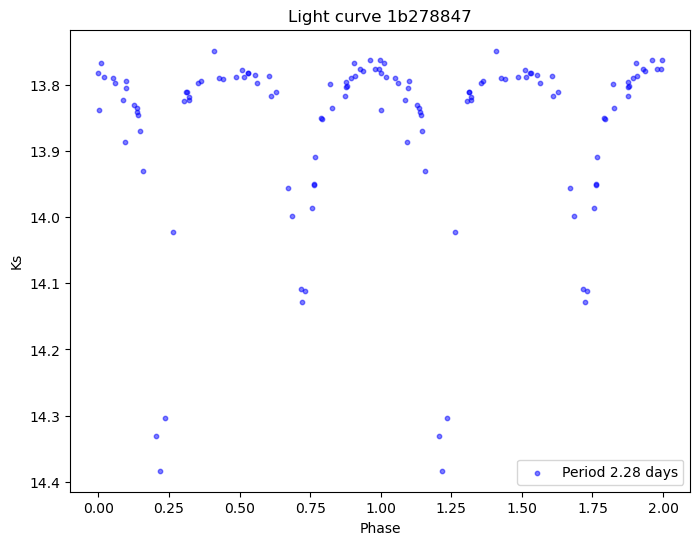

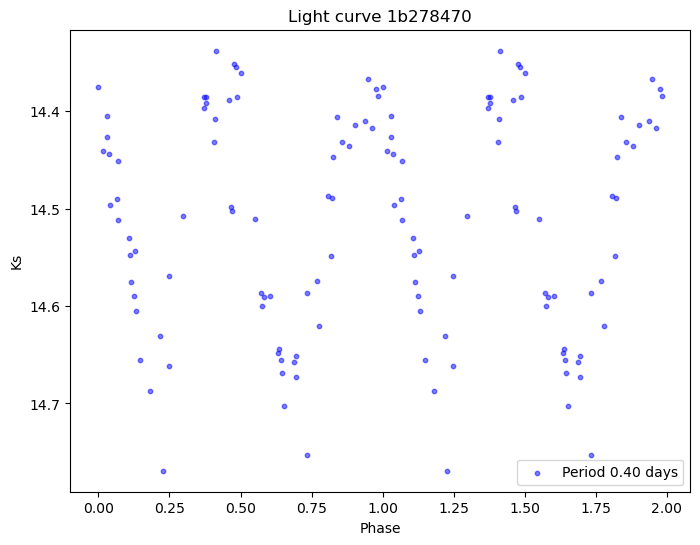

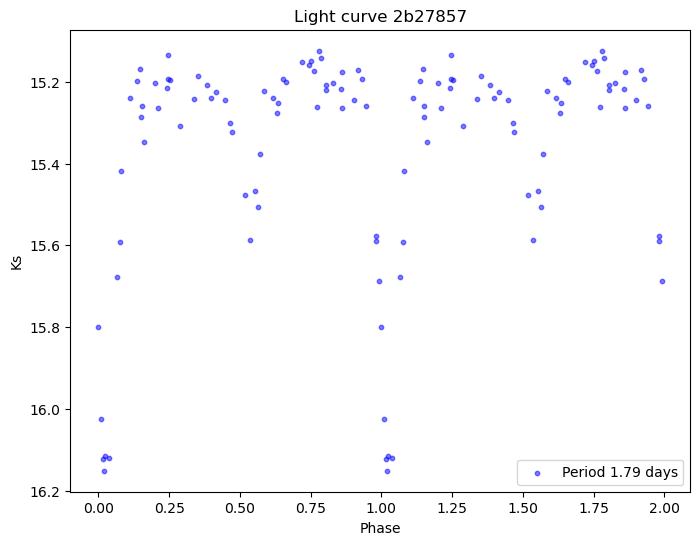

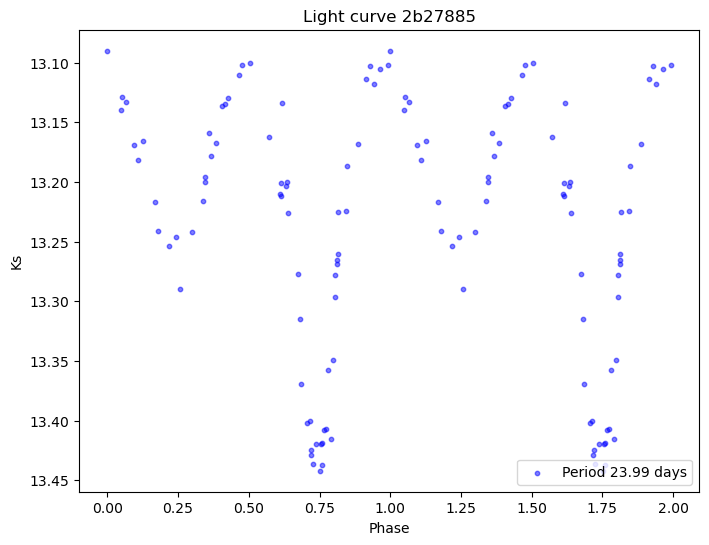

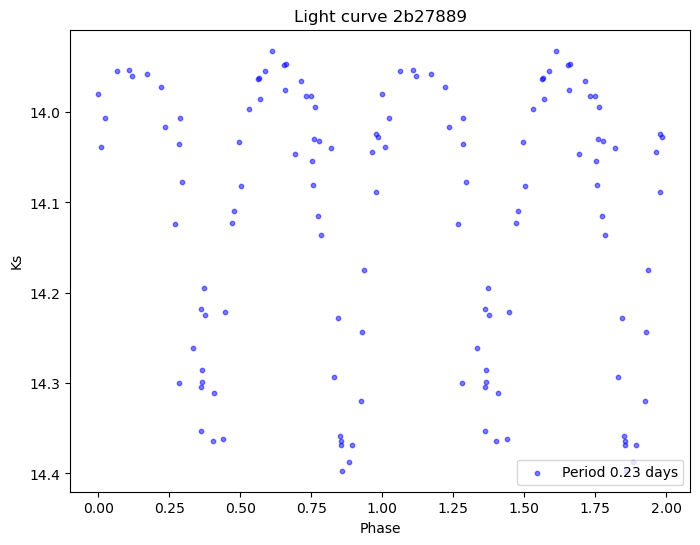

...

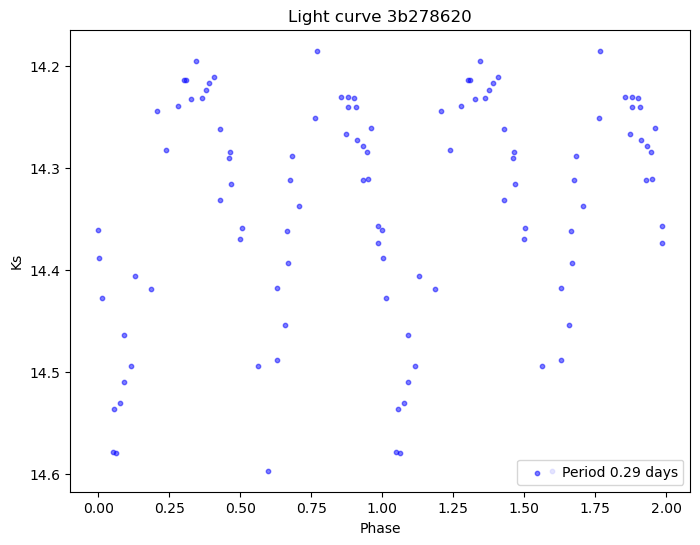

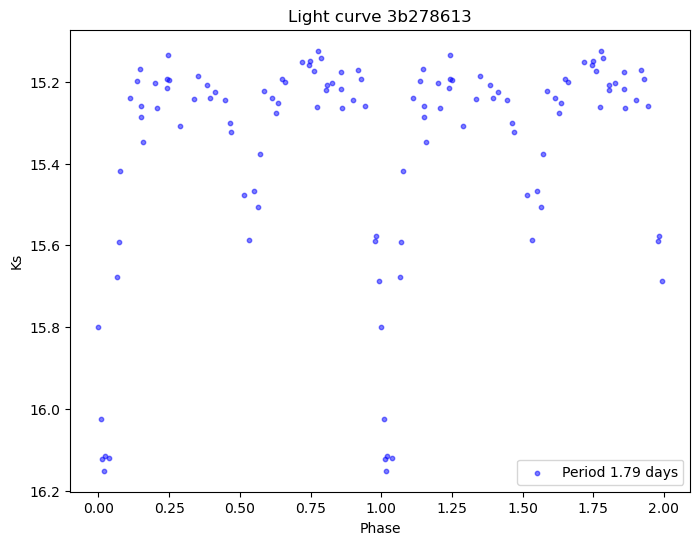

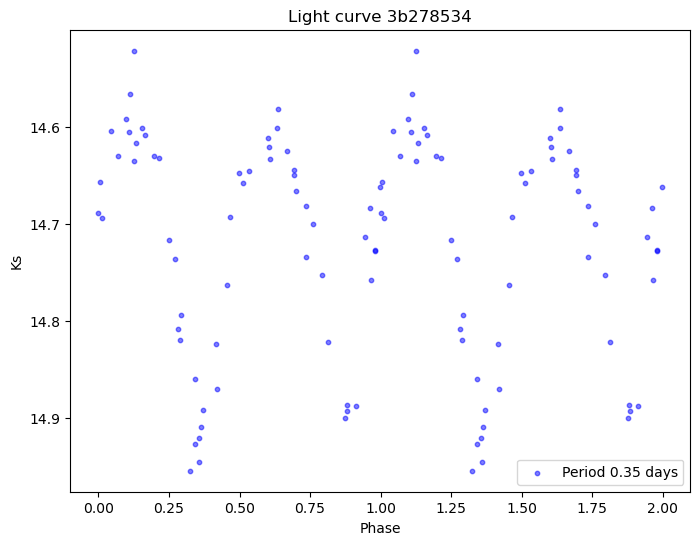

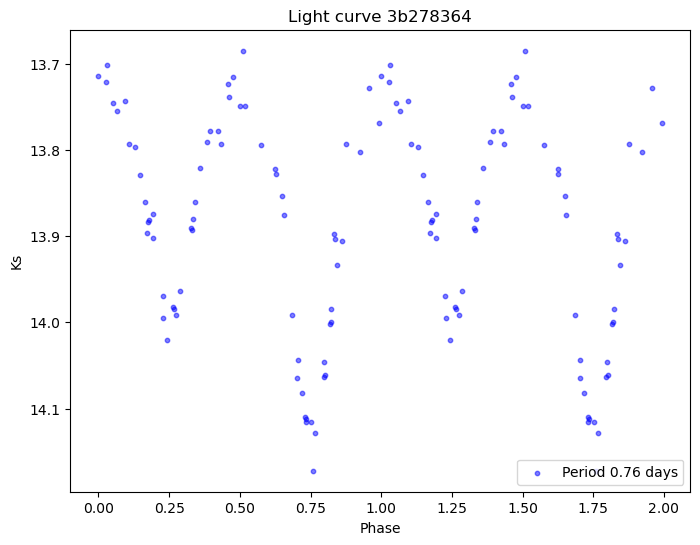

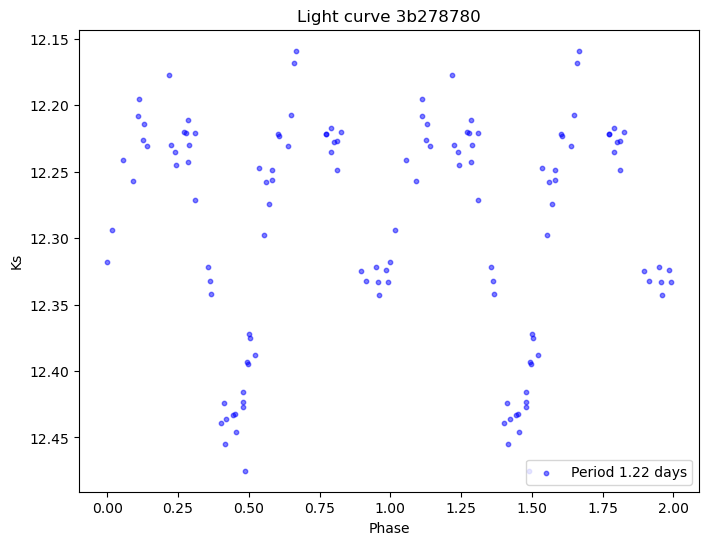

In [34]:
# Función para calcular la fase
def calcular_fase(HJD, HJD_0, periodo):
    return (HJD - HJD_0) / periodo % 1


# Recorrer el diccionario y graficar las curvas de luz una por una
for clave, valor in grap78.items():
    periodo = valor[0]
    flujos = valor[1]
    HJD = archivo[1].data # Generar HJD aleatorios

    # Calcular la fase usando el primer HJD y el periodo
    fase = calcular_fase(HJD, HJD[0], periodo)

    # Crear una nueva figura para cada curva de luz
    plt.figure(figsize=(8, 6))
    plt.scatter(fase, flujos, s=10, c='blue', alpha=0.5)
    plt.xlabel('Phase')
    plt.ylabel('Ks')
    plt.gca().invert_yaxis()
    plt.title('Light curve ' + clave)
    plt.legend(['Period {:.2f} days'.format(periodo)], loc='lower right')

    # Agregar la segunda parte de la curva
    plt.scatter(fase + 1, flujos, s=10, c='blue', alpha=0.5)

    # Guardar cada figura como una imagen separada
    plt.show()

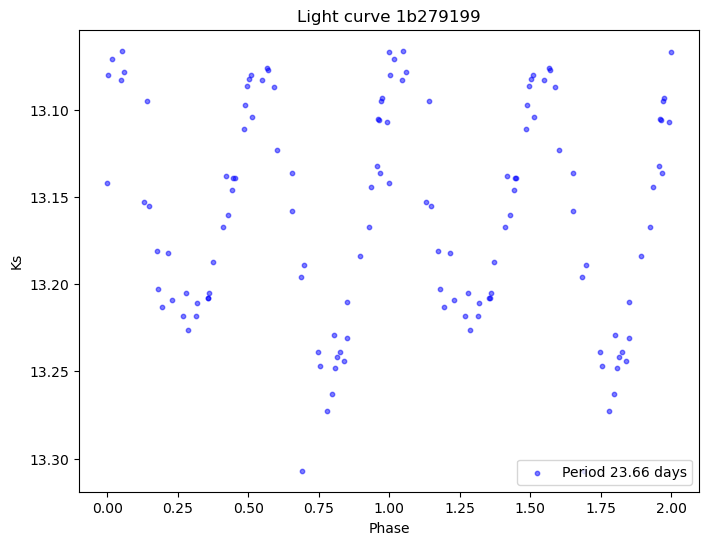

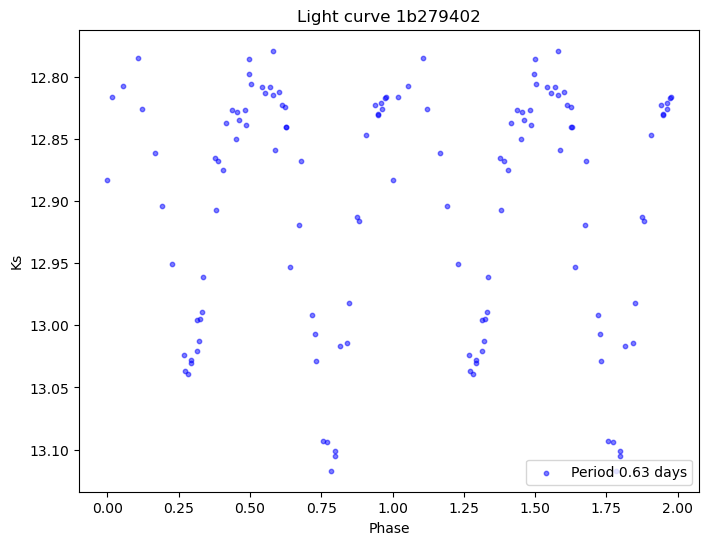

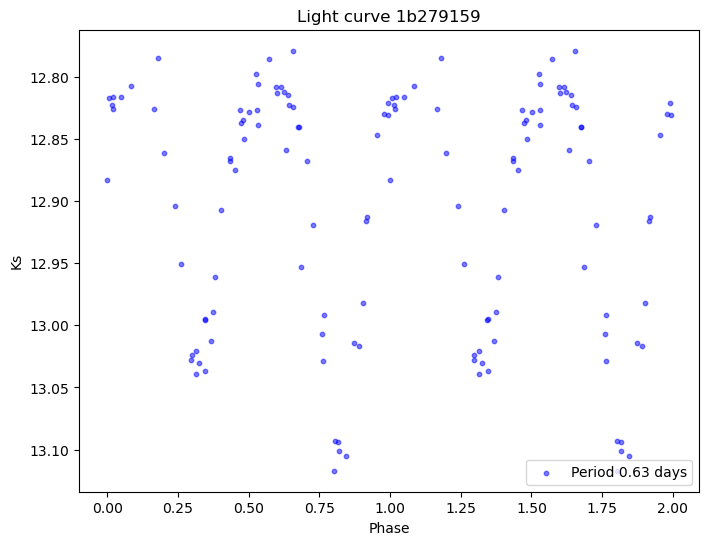

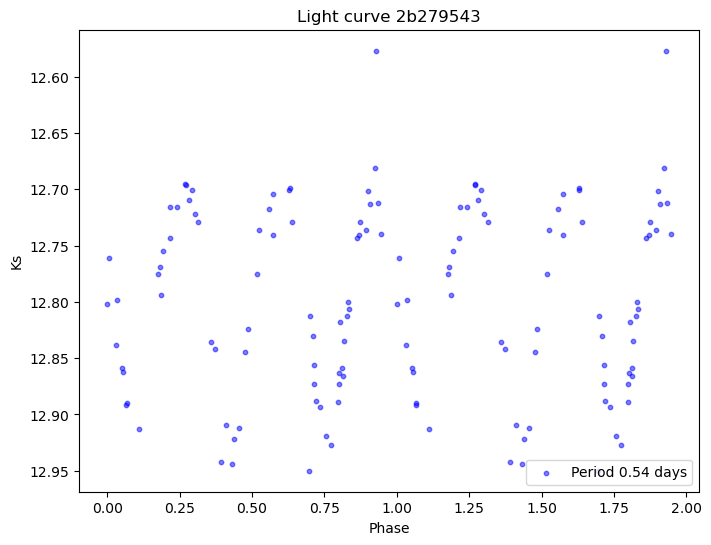

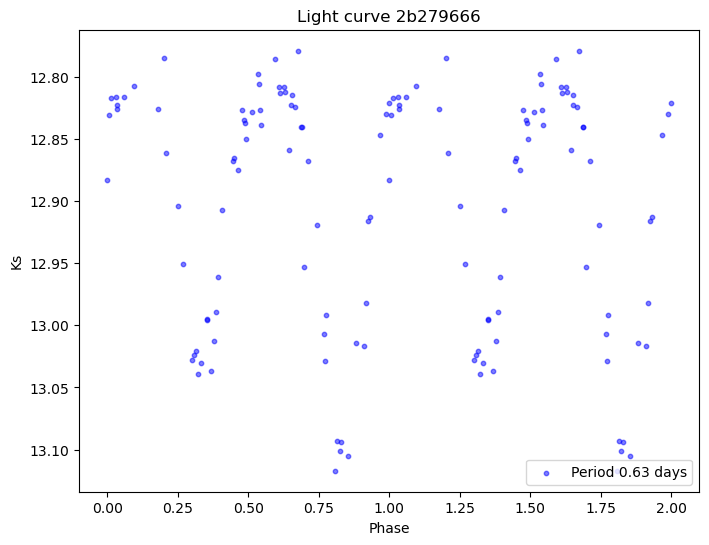

...

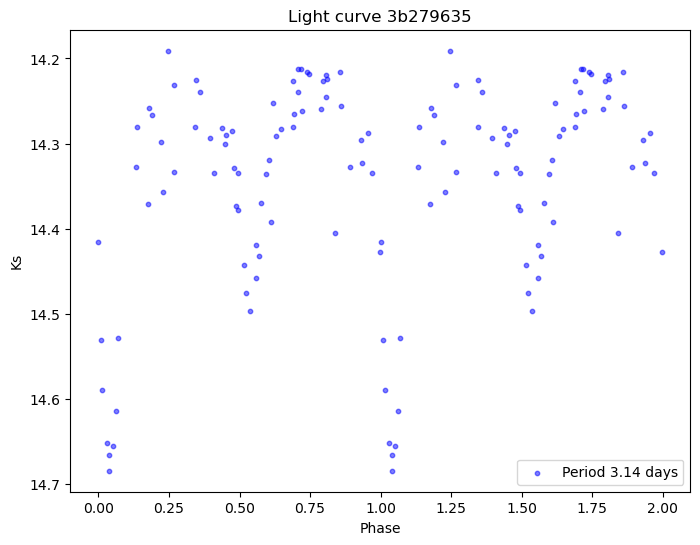

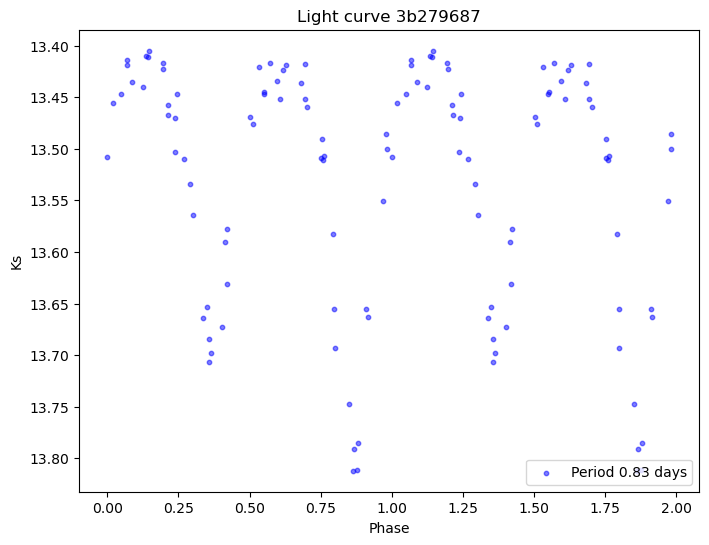

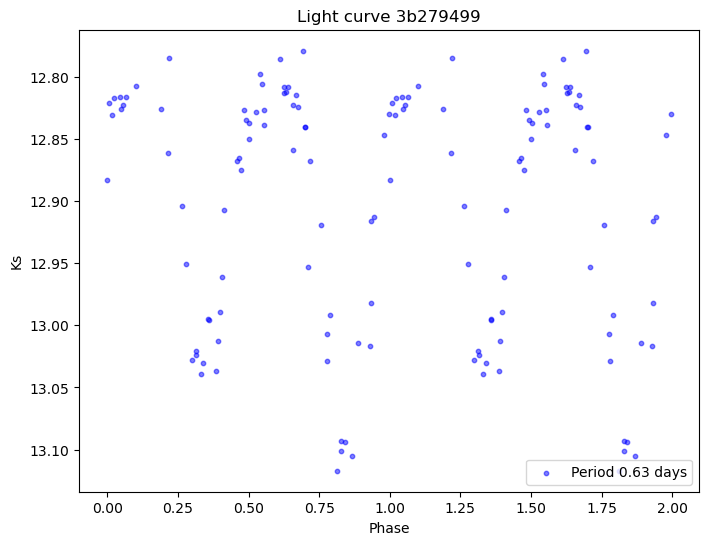

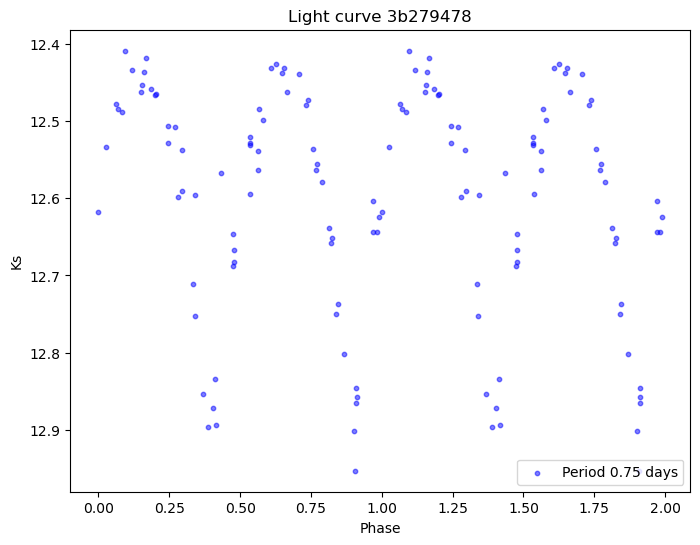

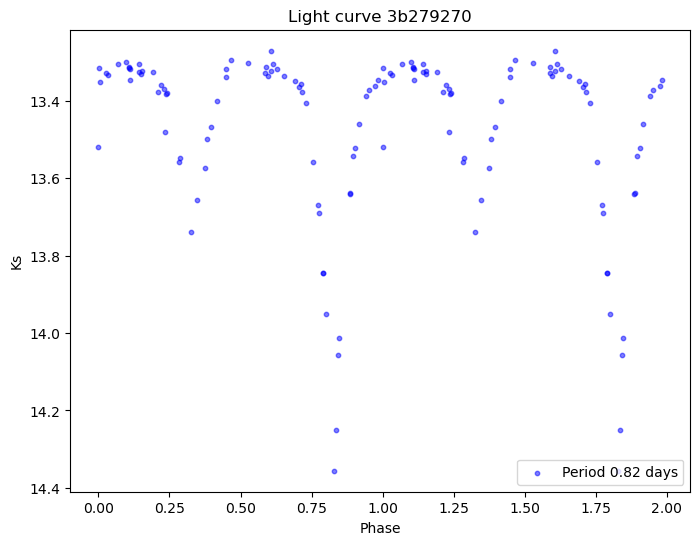

In [38]:
# Función para calcular la fase
def calcular_fase(HJD, HJD_0, periodo):
    return (HJD - HJD_0) / periodo % 1


# Recorrer el diccionario y graficar las curvas de luz una por una
for clave, valor in grap79.items():
    periodo = valor[0]
    flujos = valor[1]
    HJD = archivo5[1].data # Generar HJD aleatorios

    # Calcular la fase usando el primer HJD y el periodo
    fase = calcular_fase(HJD, HJD[0], periodo)

    # Crear una nueva figura para cada curva de luz
    plt.figure(figsize=(8, 6))
    plt.scatter(fase, flujos, s=10, c='blue', alpha=0.5)
    plt.xlabel('Phase')
    plt.ylabel('Ks')
    plt.gca().invert_yaxis()
    plt.title('Light curve ' + clave)
    plt.legend(['Period {:.2f} days'.format(periodo)], loc='lower right')

    # Agregar la segunda parte de la curva
    plt.scatter(fase + 1, flujos, s=10, c='blue', alpha=0.5)

    # Guardar cada figura como una imagen separada
    plt.show()

In [40]:
def data (inicio:str, Ks:np.array, nombre:str):
    variables=d2_v[0].tolist()
    periodos=d2_v[1].tolist()
    Datos1={}
    V1=[]
    for i, elemento in enumerate(variables):
        nombre_sin_extension = os.path.splitext(elemento)[0]  # Eliminar la extensión ".txt"
        if nombre_sin_extension.startswith(inicio):
            # Obtener el número final del nombre
            numero = int(nombre_sin_extension[len(inicio):])
            Datos1[nombre+str(numero)] = [periodos[i], Ks[numero]]
            V1.append(Ks[numero])
    return Datos1, V1

data1, var1 = data('Datos1b278', Ks2_78, '1b278')
data2, var2 = data('Datosb278', Ks1_78, '12b278')
data3, var3 = data ('b278D', Ks4_78, '2b278' )
data4, var4 = data ('Datos2b278', Ks3_78, '2b278')
data5, var5 = data ('Datos3b278', Ks5_78, '3b278')

data6, var6 = data('Datos1b279', Ks6_79, '1b279')
data7, var7 = data ('Datos2b279', Ks7_79, '2b279')
data8, var8 = data ('Datos3b279', Ks8_79, '3b279')

grap78= {}
grap78.update(data1)
grap78.update(data2)
grap78.update(data3)
grap78.update(data4)
grap78.update(data5)

grap79= {}
grap79.update(data6)
grap79.update(data7)
grap79.update(data8)
variable= var1+var2+var3+var4+var5+var6+var7+var8
print(grap79)

{'1b279434': [15.639698, array([12.538, 12.615, 12.613, 12.499, 12.568, 12.581, 12.487, 12.637,
       12.465, 12.526, 12.663, 12.676, 12.545, 12.487, 12.596, 12.573,
       12.648, 12.588, 12.493, 12.608, 12.604, 12.558, 12.564, 12.577,
       12.632, 12.507, 12.537, 12.528, 12.47 , 12.674, 12.504, 12.577,
       12.48 , 12.548, 12.503, 12.594, 12.583, 12.584, 12.578, 12.488,
       12.603, 12.693, 12.638, 12.499, 12.592, 12.57 , 12.527, 12.642,
       12.537, 12.481, 12.57 , 12.485, 12.642, 12.512, 12.622, 12.663,
       12.627, 12.408, 12.609, 12.495, 12.663, 12.536, 12.618, 12.598,
       12.517, 12.66 , 12.5  , 12.442])], '1b279190': [1.661984, array([15.611, 15.492, 15.445, 15.411, 15.463, 15.389, 16.089, 15.537,
       15.526, 16.045, 15.533, 15.361, 15.824, 15.444, 15.475, 15.526,
       15.879, 15.502, 15.584, 15.515, 15.846, 15.575, 15.551, 15.532,
       15.404, 15.652, 15.591, 15.522, 16.062, 16.04 , 15.47 , 15.544,
       15.494, 15.458, 15.672, 15.631, 15.609, 15.284, 15.

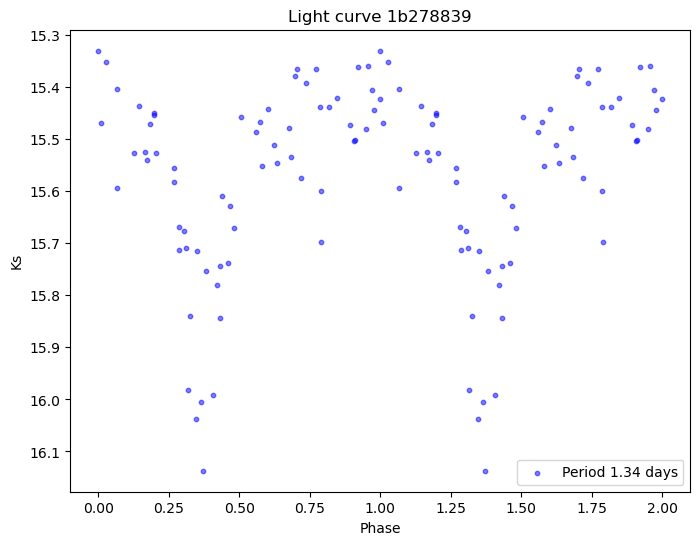

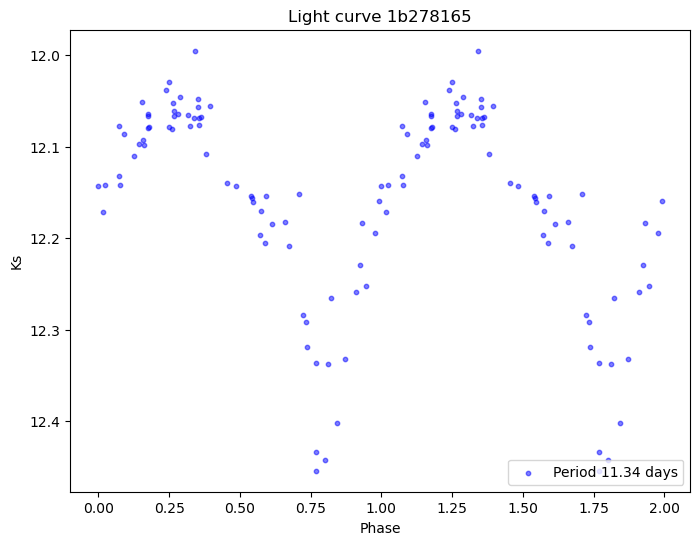

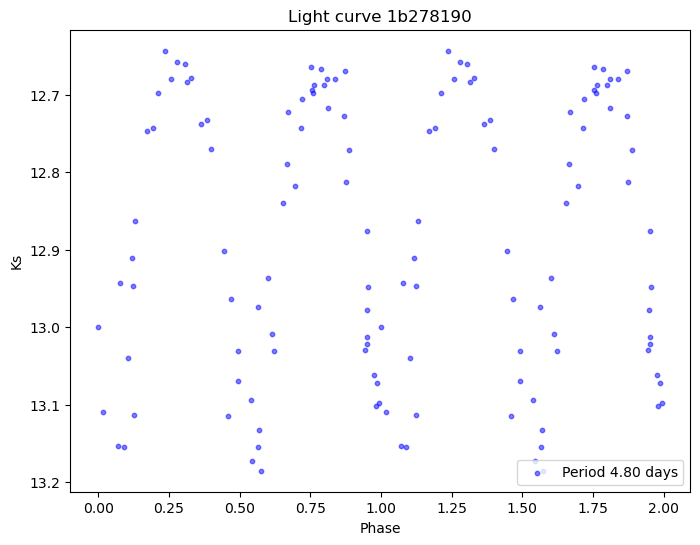

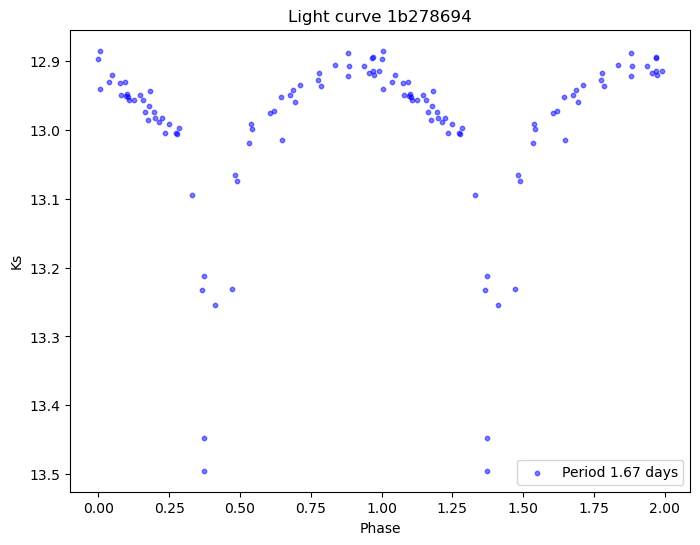

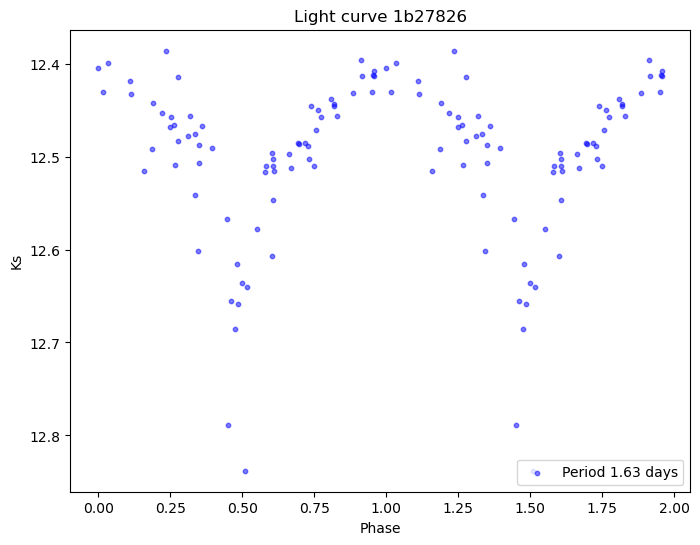

...

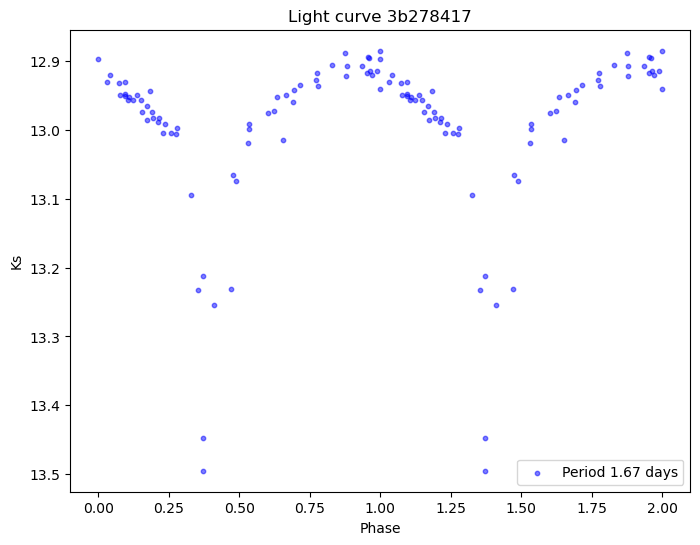

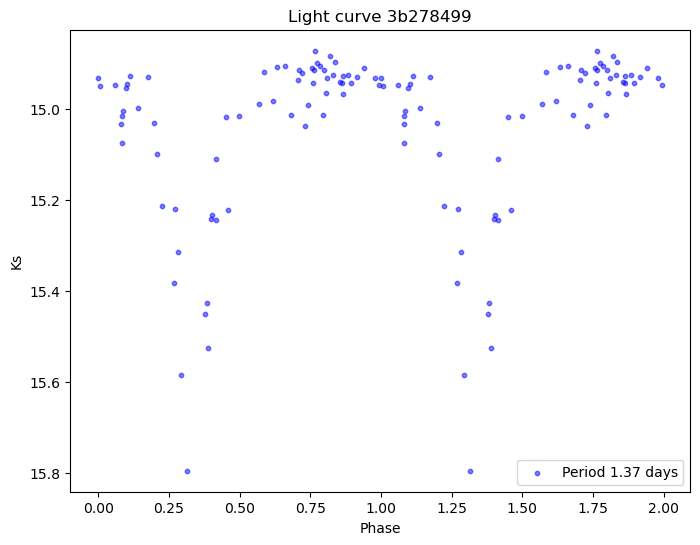

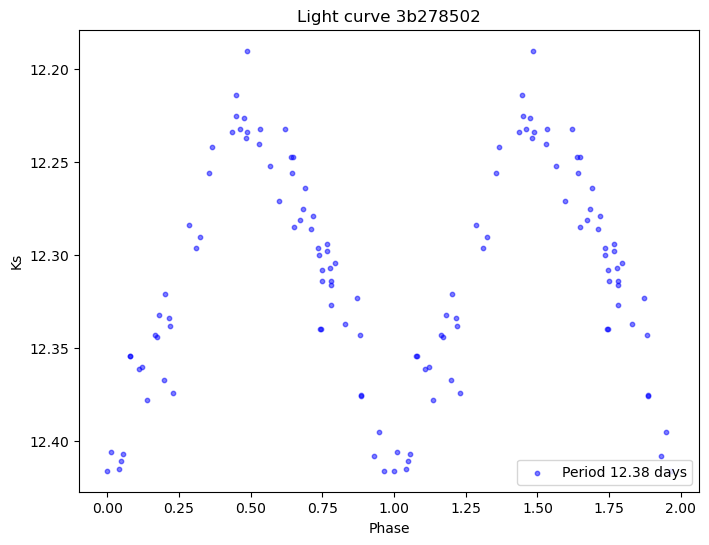

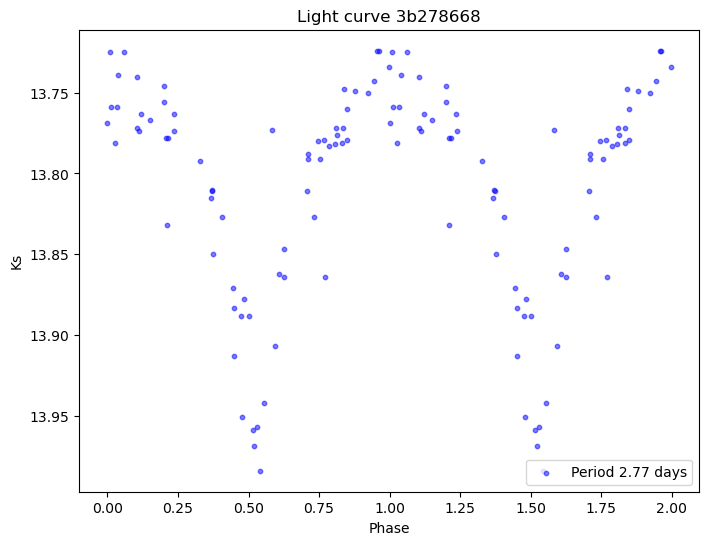

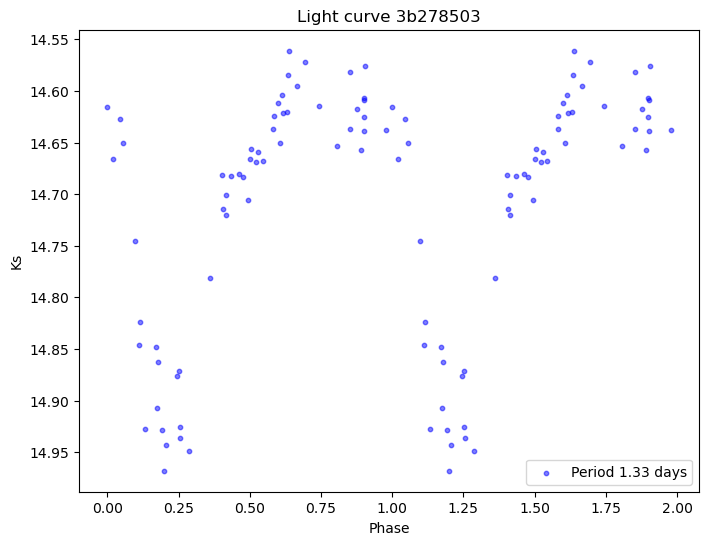

In [41]:
# Función para calcular la fase
def calcular_fase(HJD, HJD_0, periodo):
    return (HJD - HJD_0) / periodo % 1


# Recorrer el diccionario y graficar las curvas de luz una por una
for clave, valor in grap78.items():
    periodo = valor[0]
    flujos = valor[1]
    HJD = archivo[1].data # Generar HJD aleatorios

    # Calcular la fase usando el primer HJD y el periodo
    fase = calcular_fase(HJD, HJD[0], periodo)

    # Crear una nueva figura para cada curva de luz
    plt.figure(figsize=(8, 6))
    plt.scatter(fase, flujos, s=10, c='blue', alpha=0.5)
    plt.xlabel('Phase')
    plt.ylabel('Ks')
    plt.gca().invert_yaxis()
    plt.title('Light curve ' + clave)
    plt.legend(['Period {:.2f} days'.format(periodo)], loc='lower right')

    # Agregar la segunda parte de la curva
    plt.scatter(fase + 1, flujos, s=10, c='blue', alpha=0.5)

    # Guardar cada figura como una imagen separada
    plt.show()

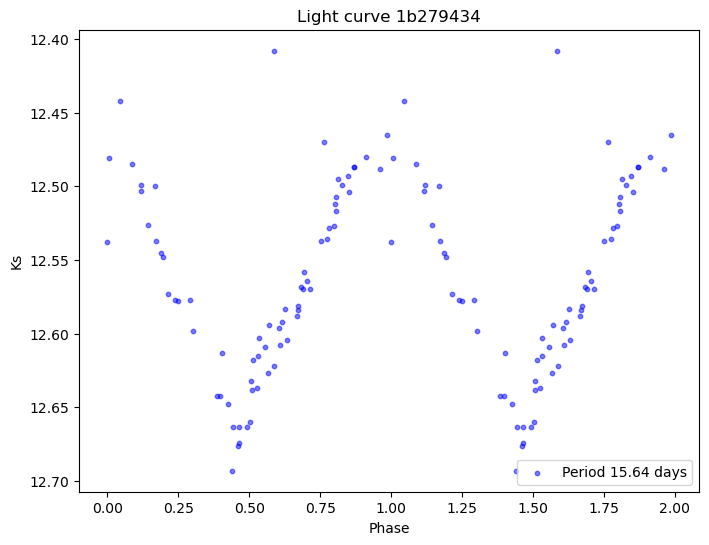

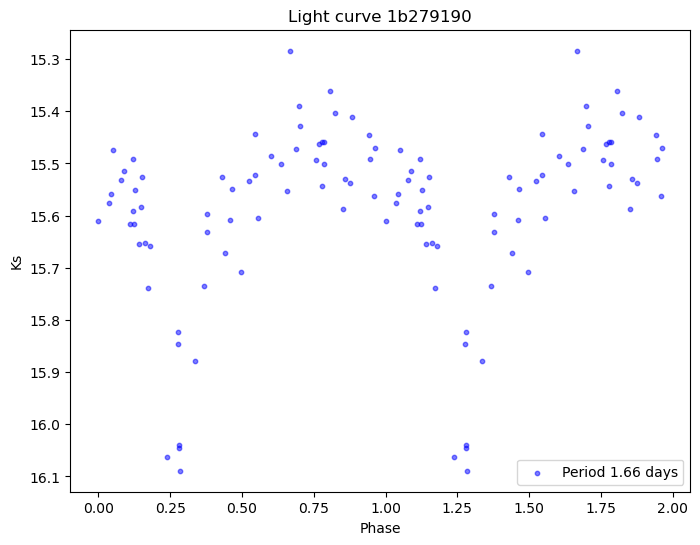

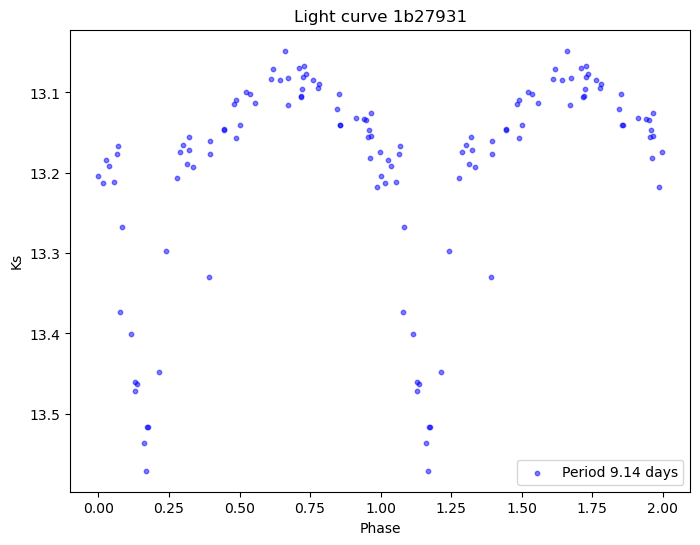

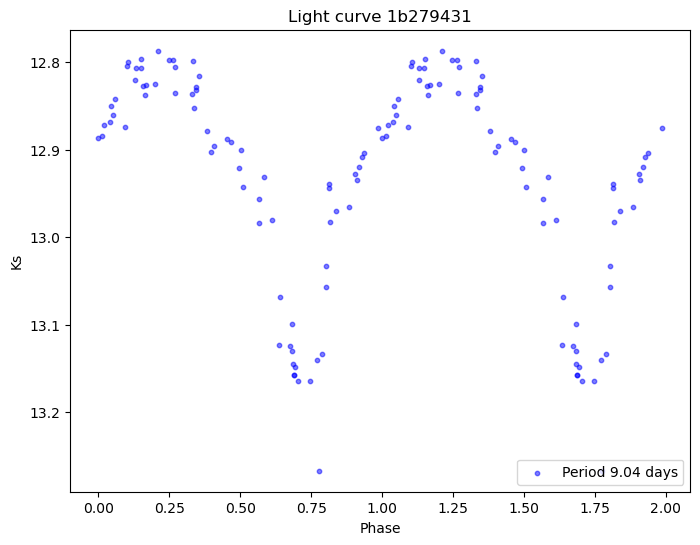

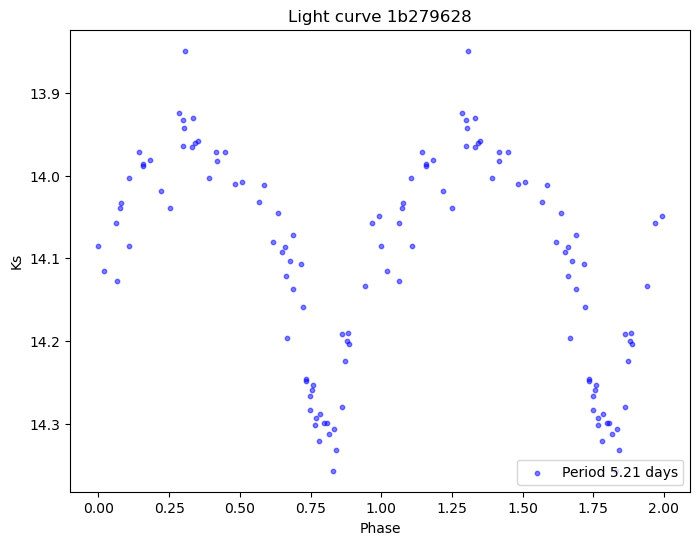

...

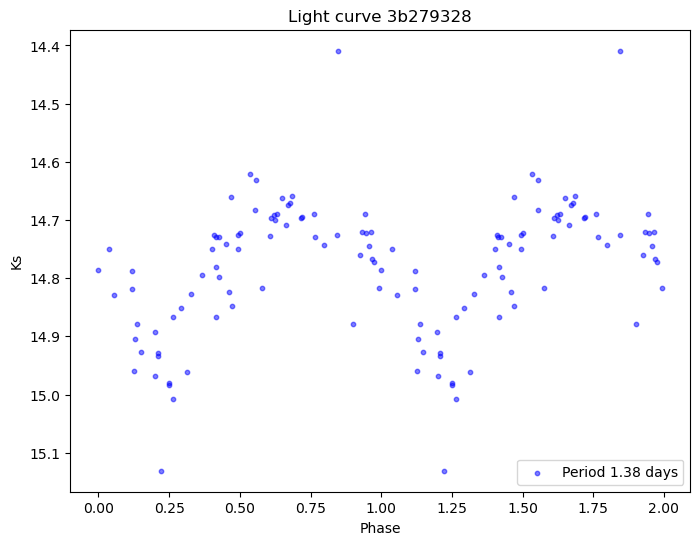

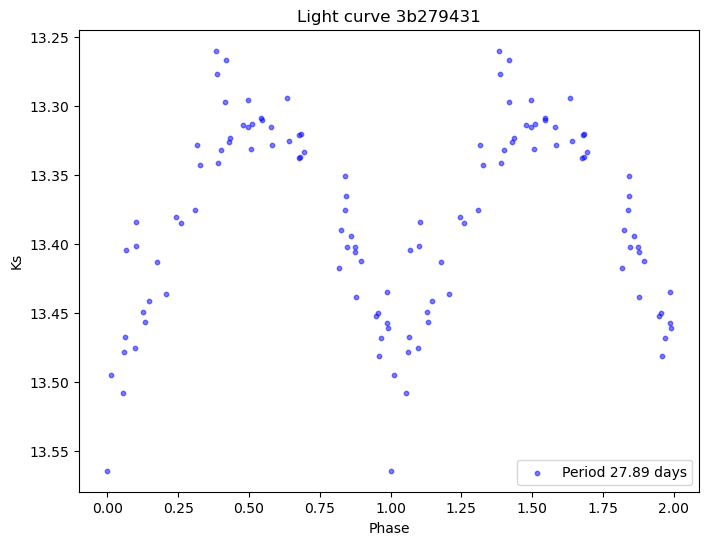

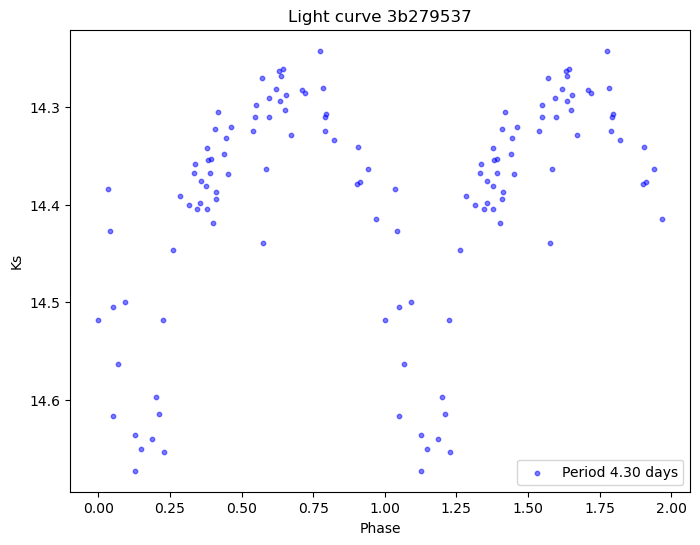

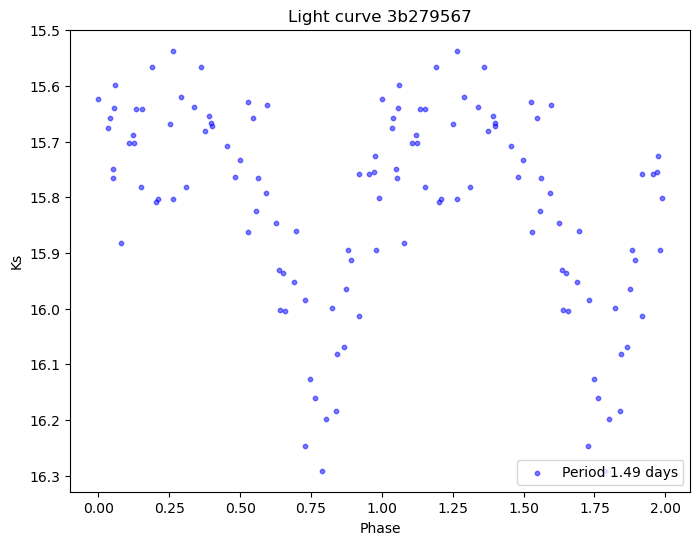

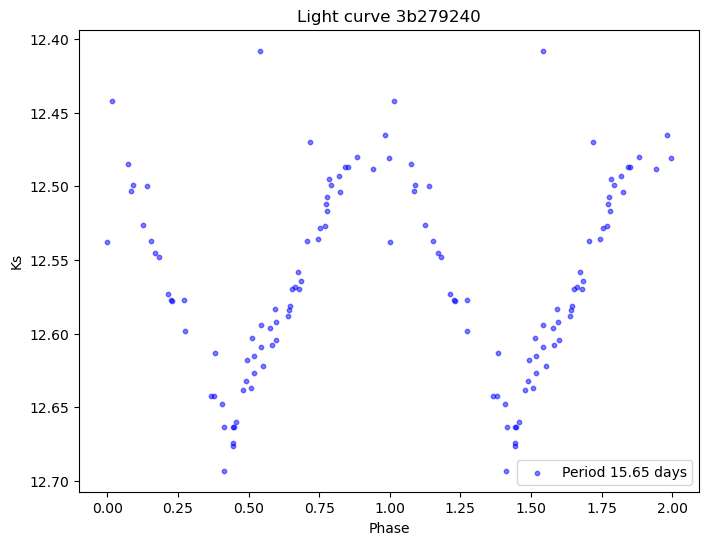

In [42]:
# Función para calcular la fase
def calcular_fase(HJD, HJD_0, periodo):
    return (HJD - HJD_0) / periodo % 1


# Recorrer el diccionario y graficar las curvas de luz una por una
for clave, valor in grap79.items():
    periodo = valor[0]
    flujos = valor[1]
    HJD = archivo5[1].data # Generar HJD aleatorios

    # Calcular la fase usando el primer HJD y el periodo
    fase = calcular_fase(HJD, HJD[0], periodo)

    # Crear una nueva figura para cada curva de luz
    plt.figure(figsize=(8, 6))
    plt.scatter(fase, flujos, s=10, c='blue', alpha=0.5)
    plt.xlabel('Phase')
    plt.ylabel('Ks')
    plt.gca().invert_yaxis()
    plt.title('Light curve ' + clave)
    plt.legend(['Period {:.2f} days'.format(periodo)], loc='lower right')

    # Agregar la segunda parte de la curva
    plt.scatter(fase + 1, flujos, s=10, c='blue', alpha=0.5)

    # Guardar cada figura como una imagen separada
    plt.show()

In [44]:
def data (inicio:str, Ks:np.array, nombre:str):
    variables=d3_v[0].tolist()
    periodos=d3_v[1].tolist()
    Datos1={}
    V1=[]
    for i, elemento in enumerate(variables):
        nombre_sin_extension = os.path.splitext(elemento)[0]  # Eliminar la extensión ".txt"
        if nombre_sin_extension.startswith(inicio):
            # Obtener el número final del nombre
            numero = int(nombre_sin_extension[len(inicio):])
            Datos1[nombre+str(numero)] = [periodos[i], Ks[numero]]
            V1.append(Ks[numero])
    return Datos1, V1

data1, var1 = data('Datos1b278', Ks2_78, '1b278')
data2, var2 = data('Datosb278', Ks1_78, '12b278')
data3, var3 = data ('b278D', Ks4_78, '2b278' )
data4, var4 = data ('Datos2b278', Ks3_78, '2b278')
data5, var5 = data ('Datos3b278', Ks5_78, '3b278')

data6, var6 = data('Datos1b279', Ks6_79, '1b279')
data7, var7 = data ('Datos2b279', Ks7_79, '2b279')
data8, var8 = data ('Datos3b279', Ks8_79, '3b279')

grap78= {}
grap78.update(data1)
grap78.update(data2)
grap78.update(data3)
grap78.update(data4)
grap78.update(data5)

grap79= {}
grap79.update(data6)
grap79.update(data7)
grap79.update(data8)
variable= var1+var2+var3+var4+var5+var6+var7+var8
print(grap79)

{'1b279523': [0.487902, array([15.052, 14.831, 14.965, 15.009, 14.84 , 14.755, 14.698, 14.755,
       15.006, 14.694, 14.973, 14.737, 14.855, 15.015, 14.684, 14.961,
       14.687, 14.682, 14.723, 14.744, 14.81 , 15.038, 14.76 , 14.821,
       14.755, 14.989, 14.852, 14.814, 14.799, 14.746, 14.757, 14.682,
       14.718, 14.949, 14.901, 14.73 , 14.85 , 14.739, 14.834, 14.758,
       15.075, 14.709, 14.742, 14.72 , 14.714, 14.843, 14.75 , 14.721,
       14.685, 15.084, 14.959, 14.838, 14.826, 14.929, 15.159, 14.714,
       15.02 , 14.649, 14.802, 14.996, 14.755, 15.081, 14.771, 14.803,
       15.076, 15.093, 15.032,    nan])], '1b279366': [0.508756, array([14.474, 14.452, 14.706, 14.59 ,    nan, 14.427, 14.461, 14.441,
       14.539, 14.57 , 14.643, 14.375, 14.384, 14.406, 14.605, 14.643,
       14.419, 14.716, 14.707, 14.45 , 14.405, 14.696, 14.415, 14.442,
       14.557, 14.405, 14.418, 14.761, 14.453, 14.486, 14.625, 14.409,
       14.725, 14.528, 14.478, 14.742, 14.453, 14.547, 14.3

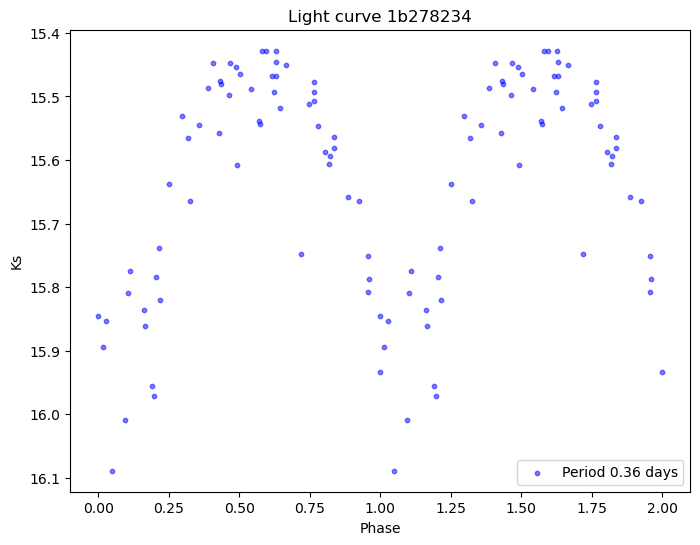

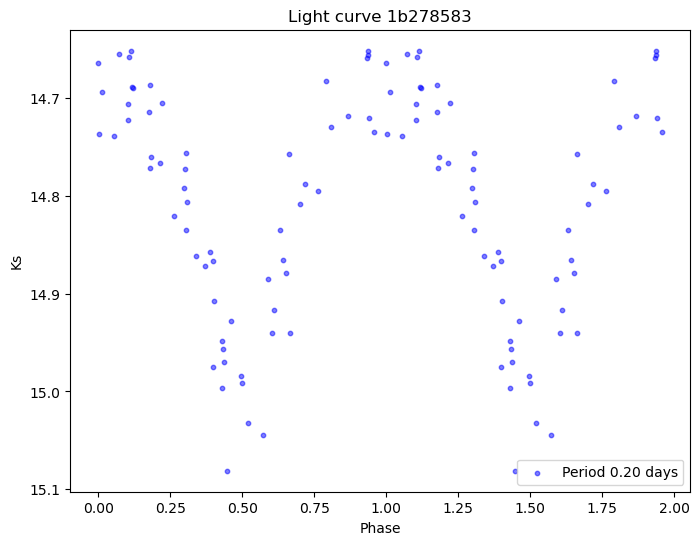

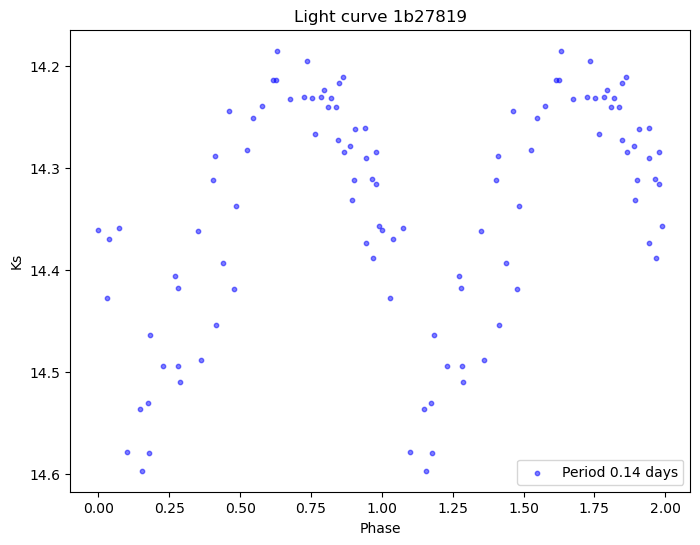

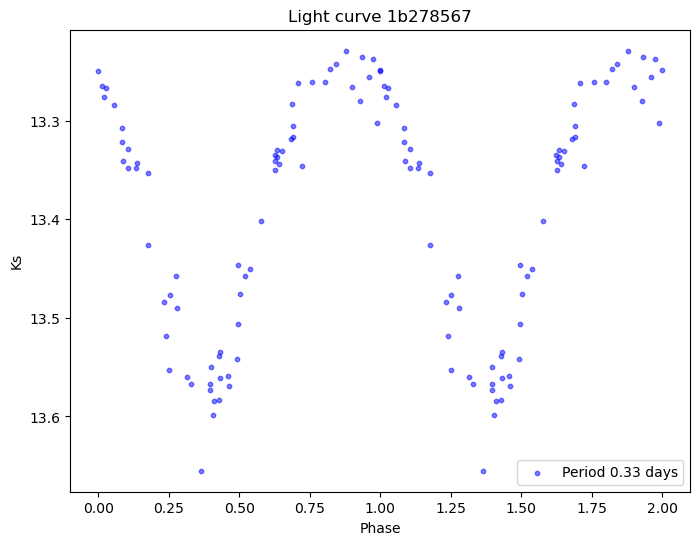

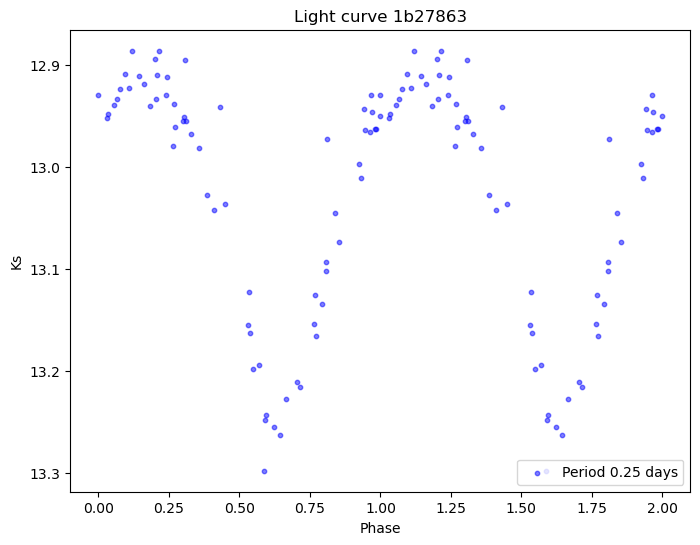

...

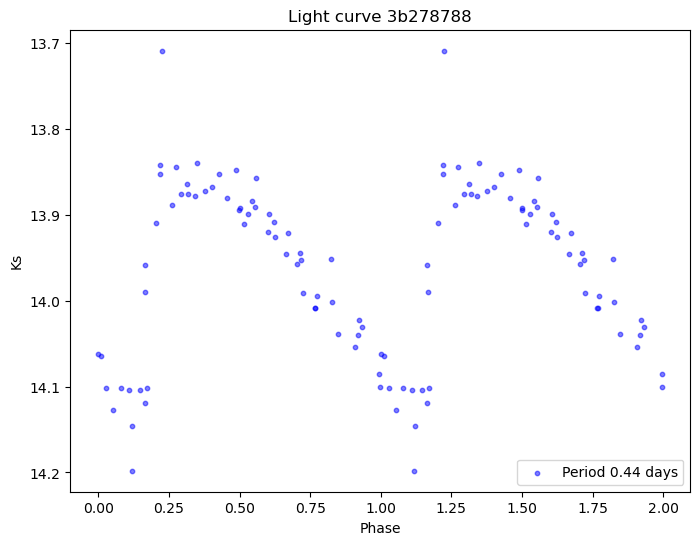

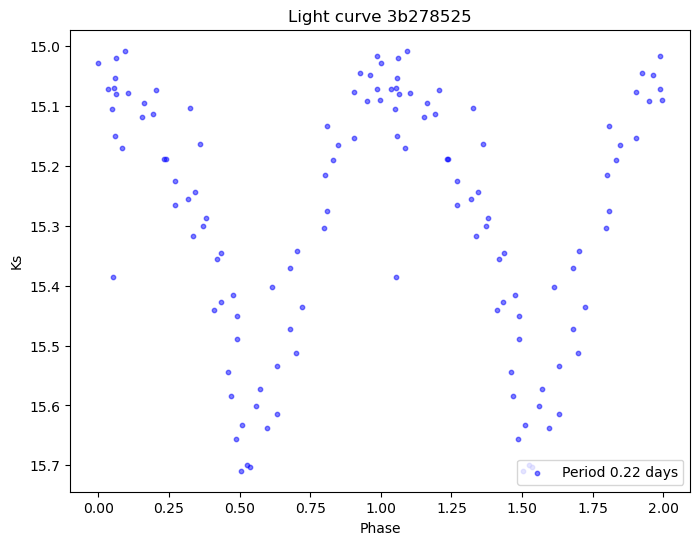

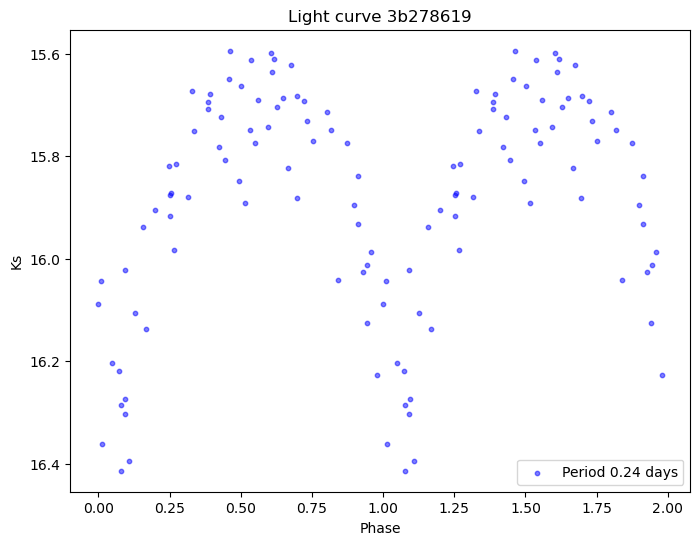

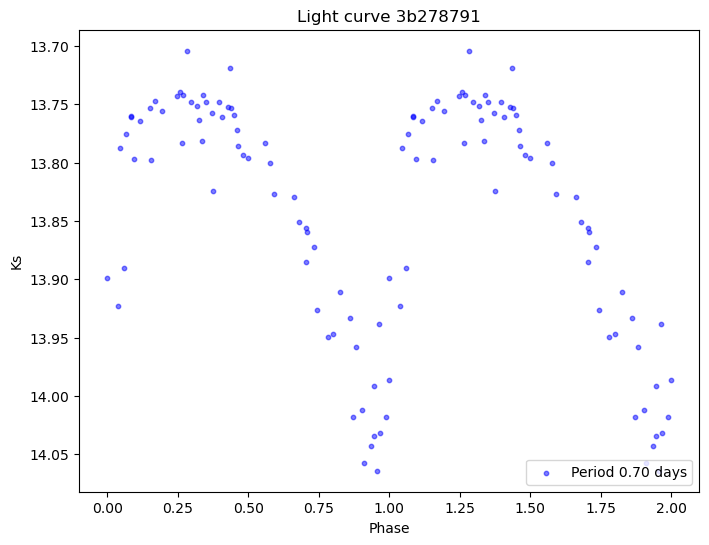

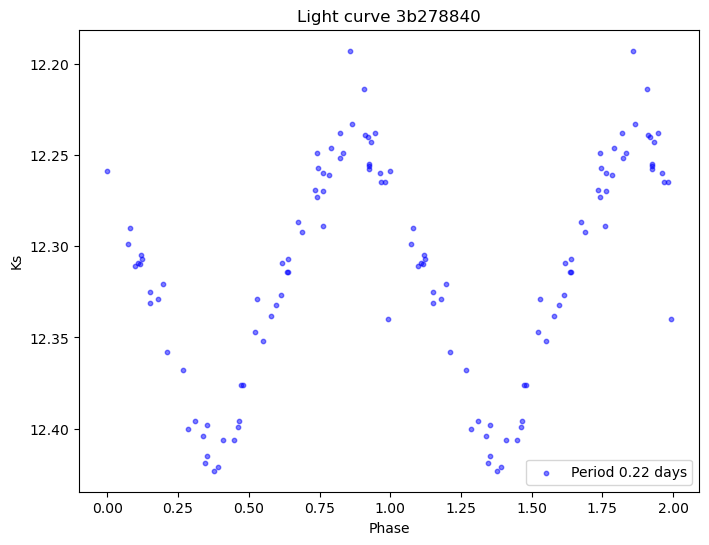

In [45]:
# Función para calcular la fase
def calcular_fase(HJD, HJD_0, periodo):
    return (HJD - HJD_0) / periodo % 1


# Recorrer el diccionario y graficar las curvas de luz una por una
for clave, valor in grap78.items():
    periodo = valor[0]
    flujos = valor[1]
    HJD = archivo[1].data # Generar HJD aleatorios

    # Calcular la fase usando el primer HJD y el periodo
    fase = calcular_fase(HJD, HJD[0], periodo)

    # Crear una nueva figura para cada curva de luz
    plt.figure(figsize=(8, 6))
    plt.scatter(fase, flujos, s=10, c='blue', alpha=0.5)
    plt.xlabel('Phase')
    plt.ylabel('Ks')
    plt.gca().invert_yaxis()
    plt.title('Light curve ' + clave)
    plt.legend(['Period {:.2f} days'.format(periodo)], loc='lower right')

    # Agregar la segunda parte de la curva
    plt.scatter(fase + 1, flujos, s=10, c='blue', alpha=0.5)

    # Guardar cada figura como una imagen separada
    plt.show()

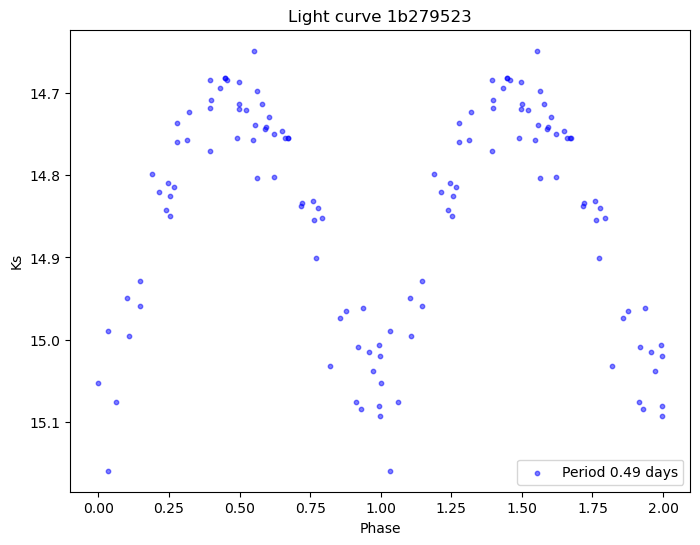

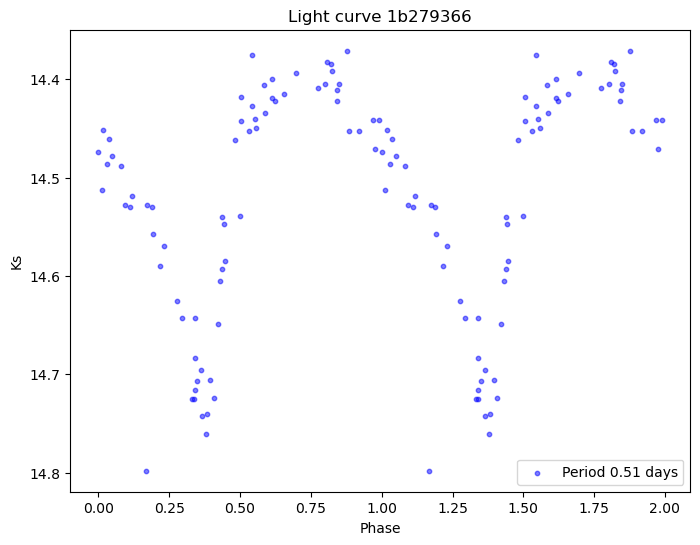

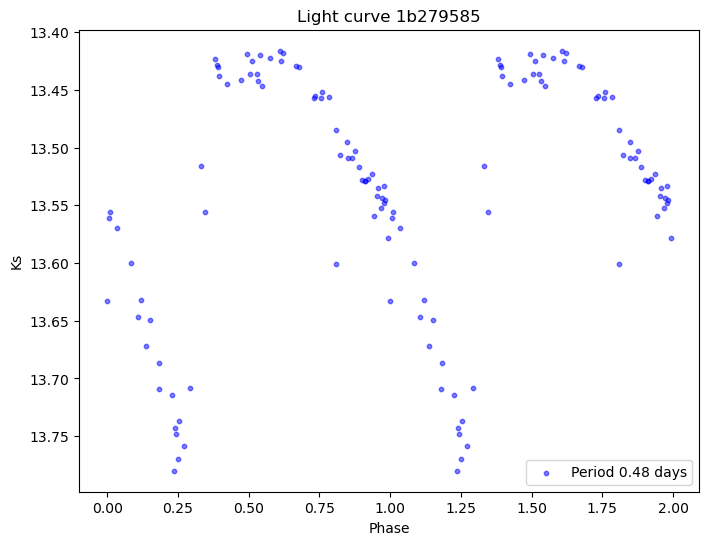

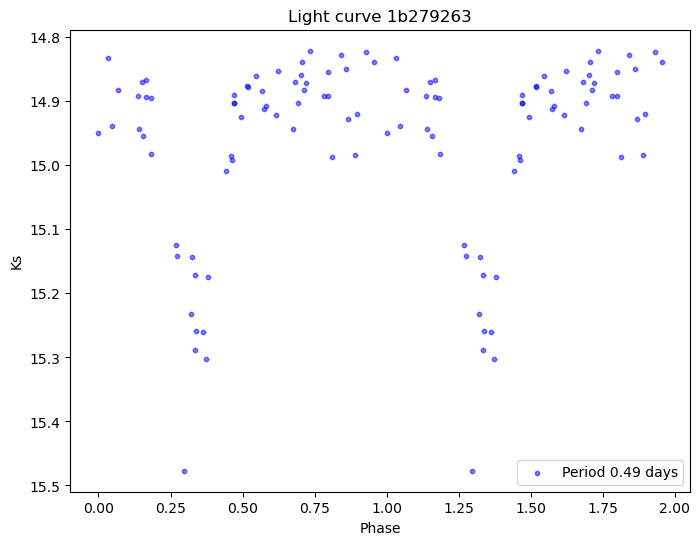

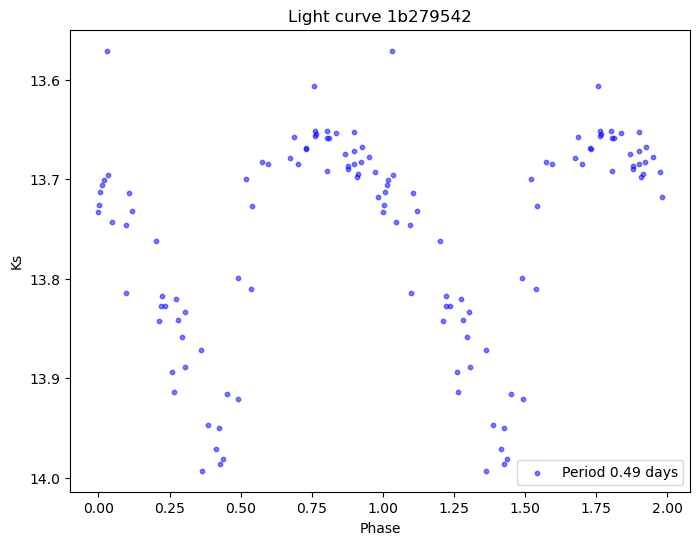

...

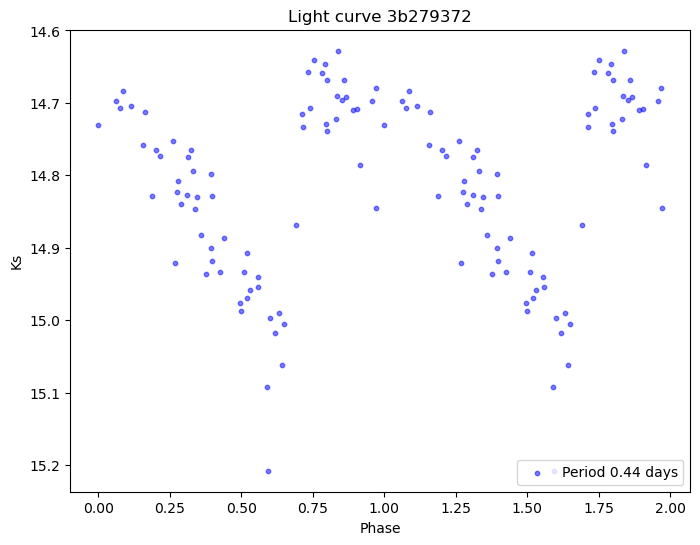

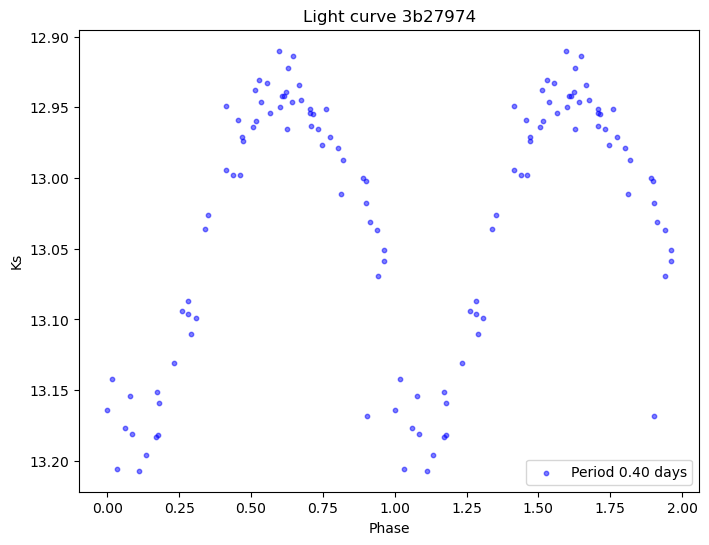

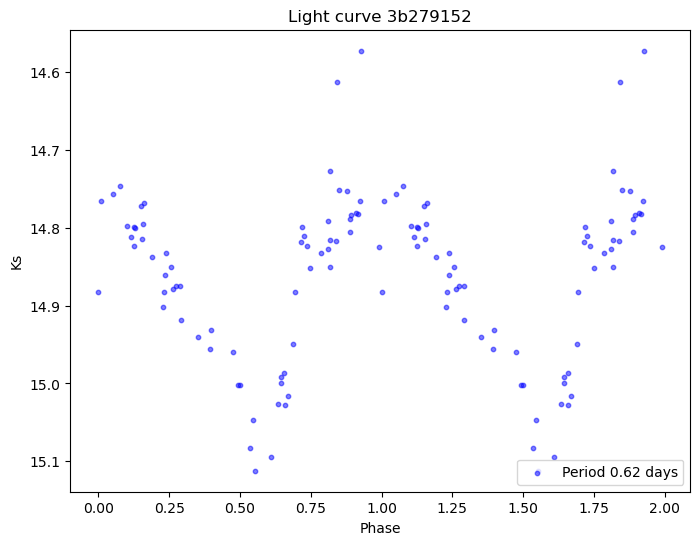

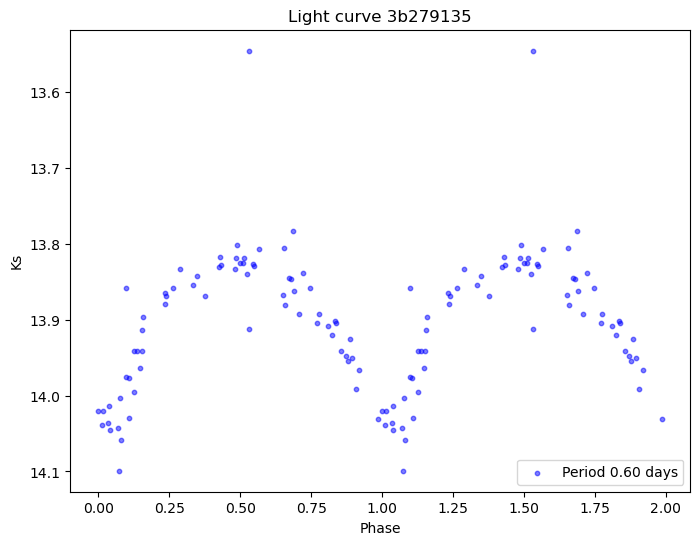

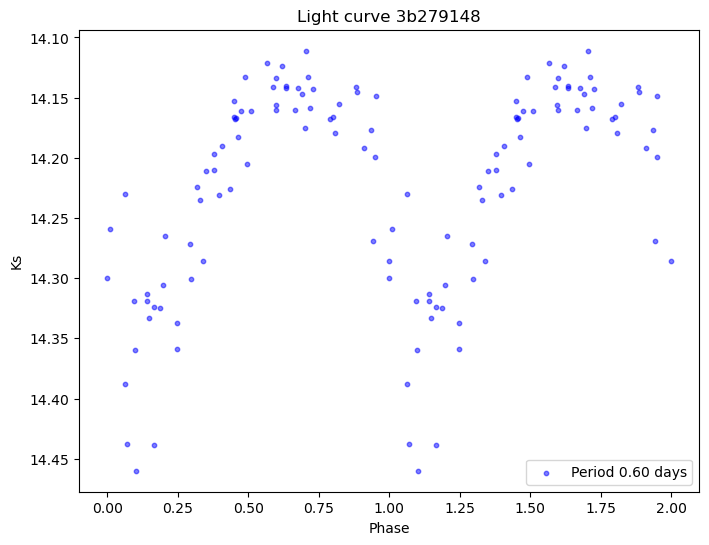

In [48]:
# Función para calcular la fase
def calcular_fase(HJD, HJD_0, periodo):
    return (HJD - HJD_0) / periodo % 1


# Recorrer el diccionario y graficar las curvas de luz una por una
for clave, valor in grap79.items():
    periodo = valor[0]
    flujos = valor[1]
    HJD = archivo5[1].data # Generar HJD aleatorios

    # Calcular la fase usando el primer HJD y el periodo
    fase = calcular_fase(HJD, HJD[0], periodo)

    # Crear una nueva figura para cada curva de luz
    plt.figure(figsize=(8, 6))
    plt.scatter(fase, flujos, s=10, c='blue', alpha=0.5)
    plt.xlabel('Phase')
    plt.ylabel('Ks')
    plt.gca().invert_yaxis()
    plt.title('Light curve ' + clave)
    plt.legend(['Period {:.2f} days'.format(periodo)], loc='lower right')

    # Agregar la segunda parte de la curva
    plt.scatter(fase + 1, flujos, s=10, c='blue', alpha=0.5)

    # Guardar cada figura como una imagen separada
    plt.show()

In [55]:
def data (inicio:str, Ks:np.array, nombre:str):
    variables=d4_v[0].tolist()
    periodos=d4_v[1].tolist()
    Datos1={}
    V1=[]
    for i, elemento in enumerate(variables):
        nombre_sin_extension = os.path.splitext(elemento)[0]  # Eliminar la extensión ".txt"
        if nombre_sin_extension.startswith(inicio):
            # Obtener el número final del nombre
            numero = int(nombre_sin_extension[len(inicio):])
            Datos1[nombre+str(numero)] = [periodos[i], Ks[numero]]
            V1.append(Ks[numero])
    return Datos1, V1

data1, var1 = data('Datos1b278', Ks2_78, '1b278')
data2, var2 = data('Datosb278', Ks1_78, '12b278')
data3, var3 = data ('b278D', Ks4_78, '2b278' )
data4, var4 = data ('Datos2b278', Ks3_78, '2b278')
data5, var5 = data ('Datos3b278', Ks5_78, '3b278')

data6, var6 = data('Datos1b279', Ks6_79, '1b279')
data7, var7 = data ('Datos2b279', Ks7_79, '2b279')
data8, var8 = data ('Datos3b279', Ks8_79, '3b279')

grap78= {}
grap78.update(data1)
grap78.update(data2)
grap78.update(data3)
grap78.update(data4)
grap78.update(data5)

grap79= {}
grap79.update(data6)
grap79.update(data7)
grap79.update(data8)
variable= var1+var2+var3+var4+var5+var6+var7+var8
print(grap79)

{'1b279196': [1.032717, array([15.194, 15.364, 15.042, 15.316, 15.084, 15.081, 15.045, 15.074,
       15.111, 15.369, 15.038, 15.326, 15.329, 14.992, 15.009, 15.141,
       15.096, 15.026, 15.037, 15.143, 15.146, 15.188, 15.036, 15.108,
       15.264, 15.078, 15.257, 15.055, 15.188, 15.109, 15.065, 15.089,
       15.081, 15.162, 15.125, 15.056, 15.27 , 15.075, 15.21 , 15.079,
       15.131, 15.137, 15.162, 15.314, 15.153, 15.312, 15.147, 15.113,
       15.379, 15.325, 15.346, 15.098, 15.288, 15.159, 15.395, 15.283,
       15.518, 15.628, 15.672, 15.192, 15.235, 15.308, 15.22 , 15.162,
       15.074, 15.282, 15.423,    nan])], '1b279552': [0.509343, array([14.28 , 14.146, 14.334, 14.2  , 14.183, 14.157, 14.341, 14.292,
       14.287, 14.423, 14.441, 14.27 , 14.201, 14.168, 14.135, 14.367,
       14.155, 14.169, 14.173, 14.14 , 14.186, 14.257, 14.134, 14.215,
       14.202, 14.215, 14.355, 14.18 , 14.178, 14.316, 14.223, 14.236,
       14.193, 14.267, 14.164, 14.229, 14.214, 14.183, 14.1

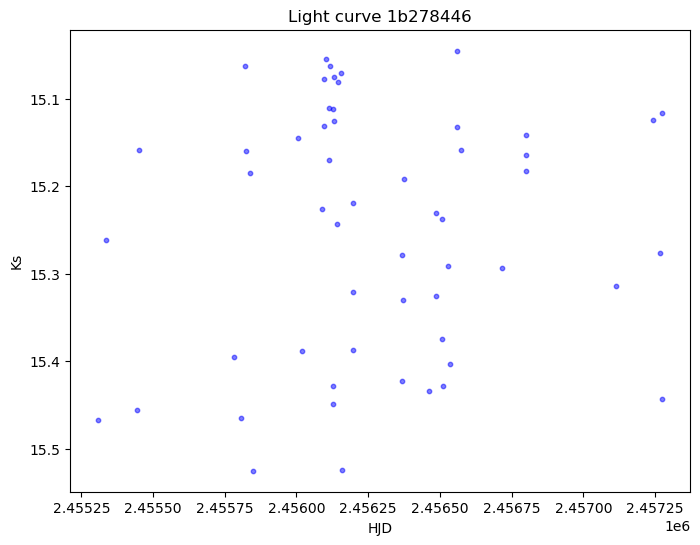

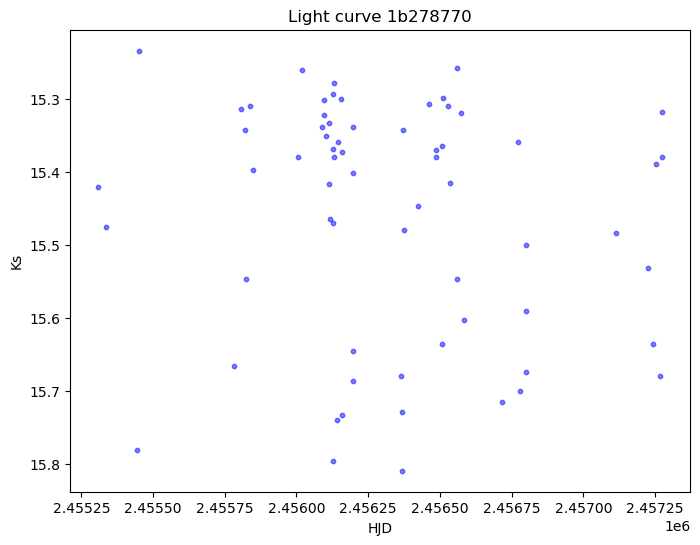

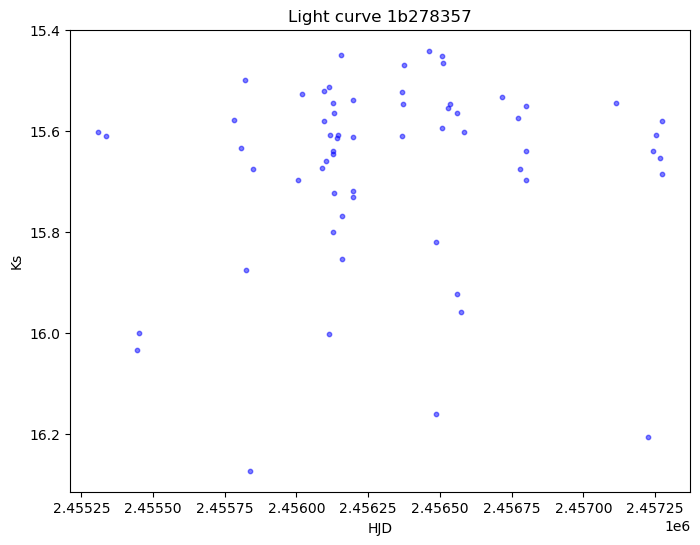

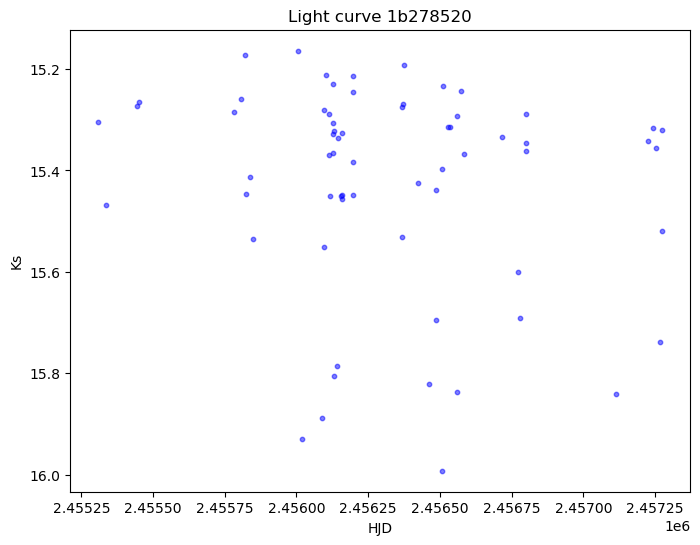

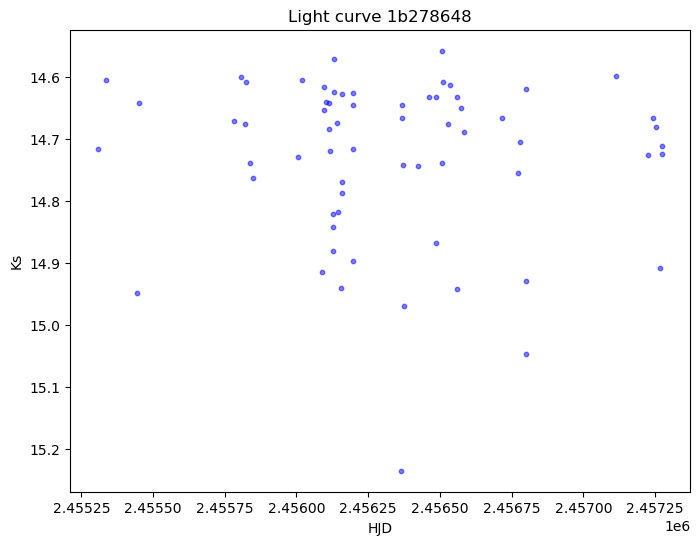

...

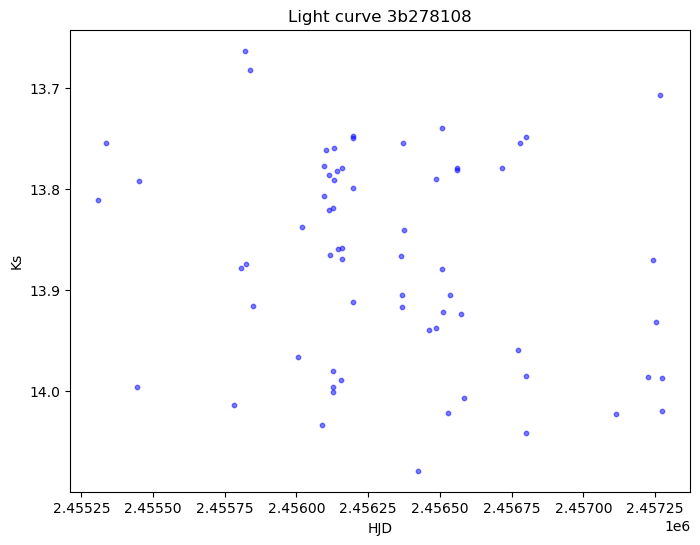

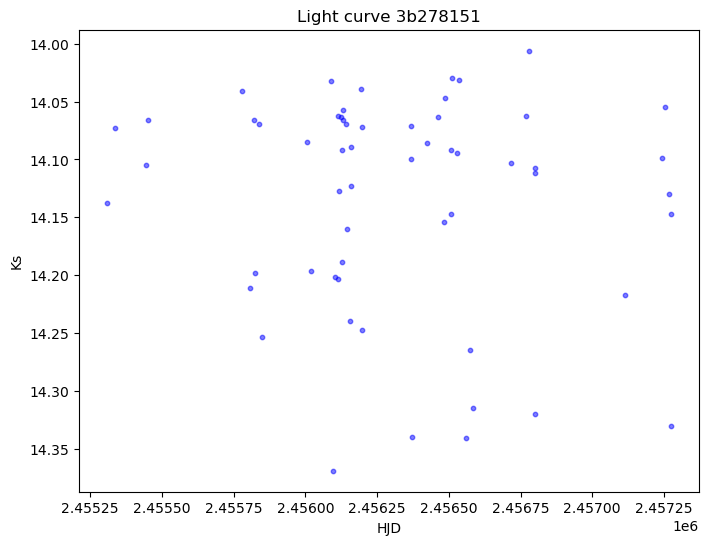

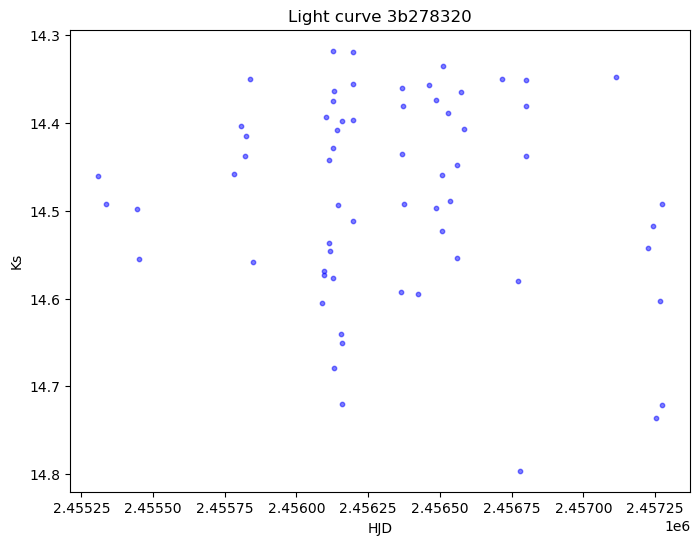

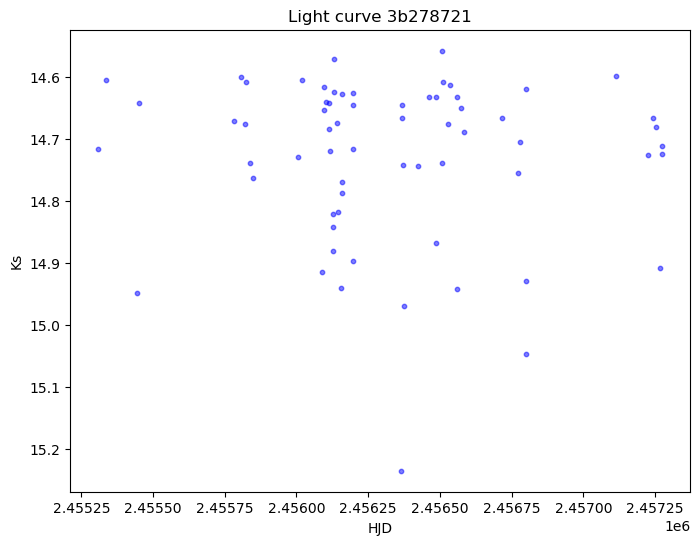

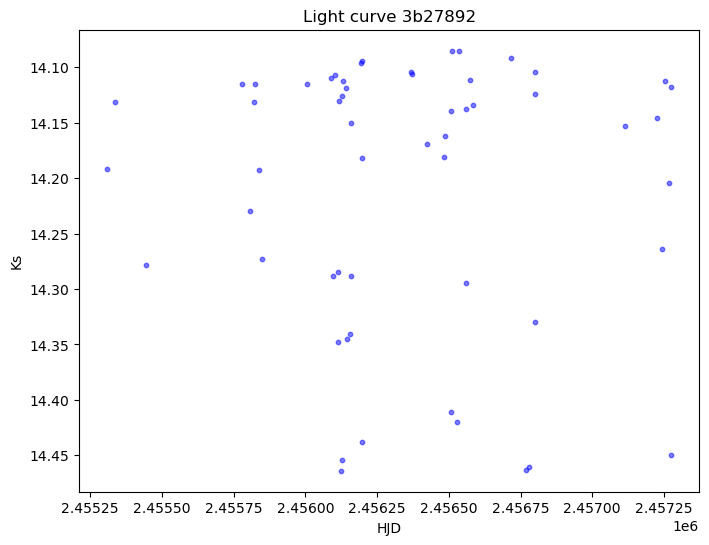

In [56]:
# Recorrer el diccionario y graficar las curvas de luz una por una
for clave, valor in grap78.items():
    flujos = valor[1]
    HJD = archivo[1].data # Generar HJD aleatorios

  
    # Crear una nueva figura para cada curva de luz
    plt.figure(figsize=(8, 6))
    plt.scatter(HJD, flujos, s=10, c='blue', alpha=0.5)
    plt.xlabel('HJD')
    plt.ylabel('Ks')
    plt.gca().invert_yaxis()
    plt.title('Light curve ' + clave)
     
    # Guardar cada figura como una imagen separada
    plt.show()

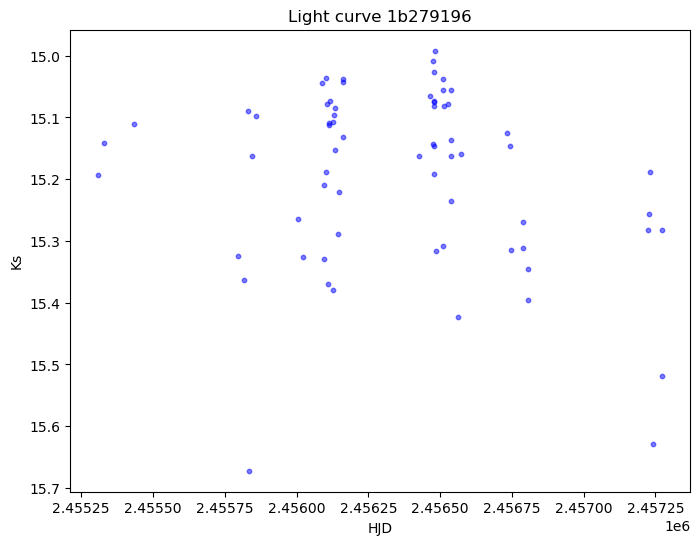

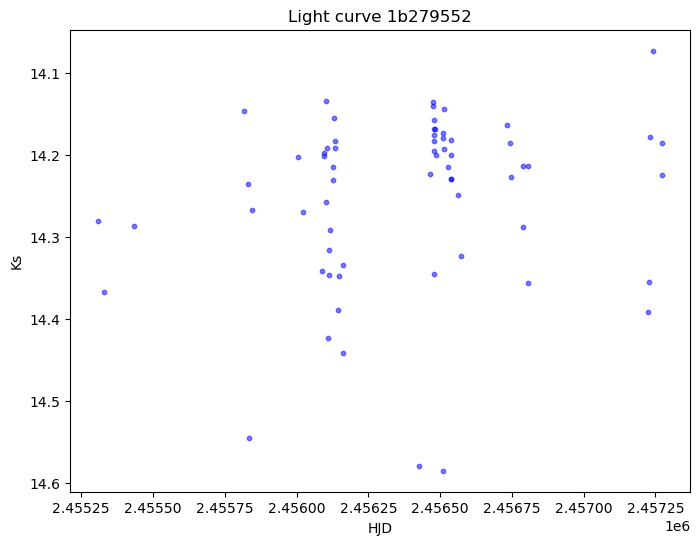

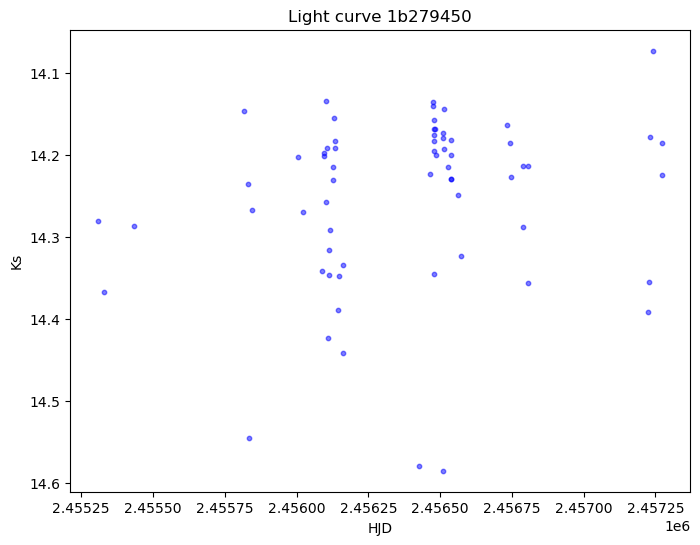

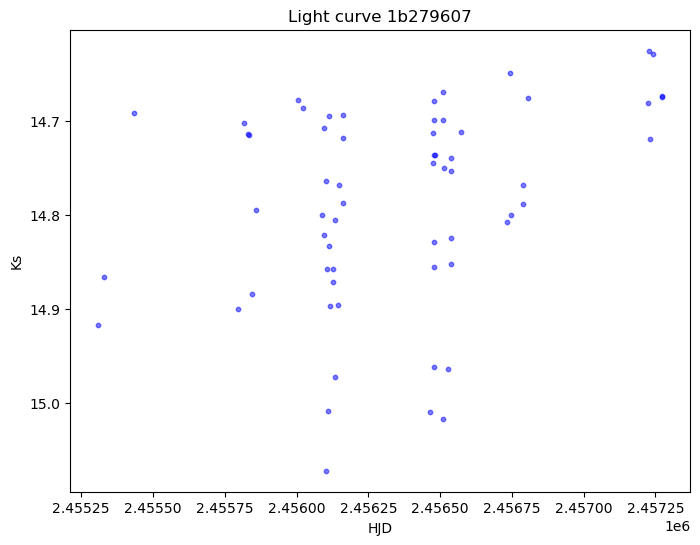

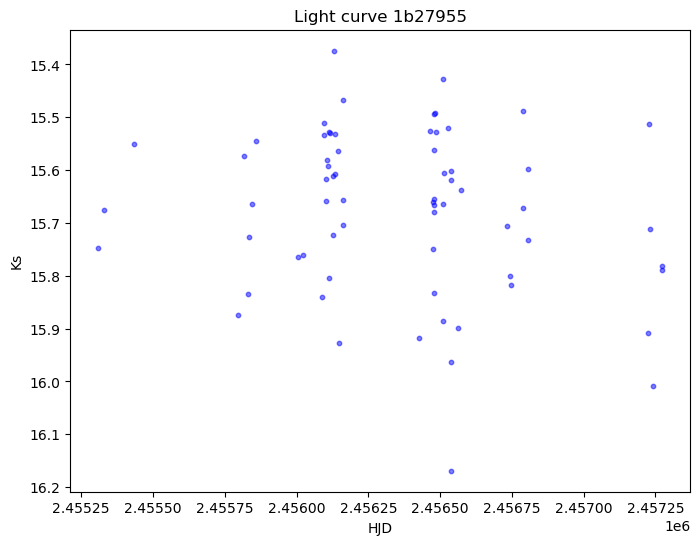

...

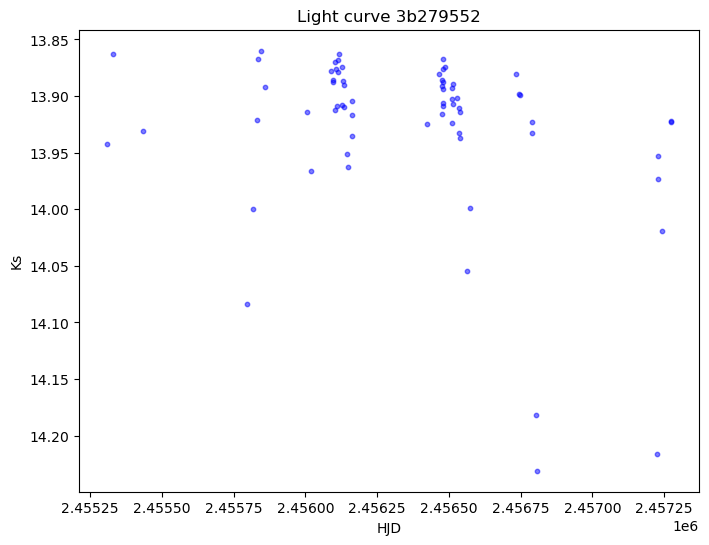

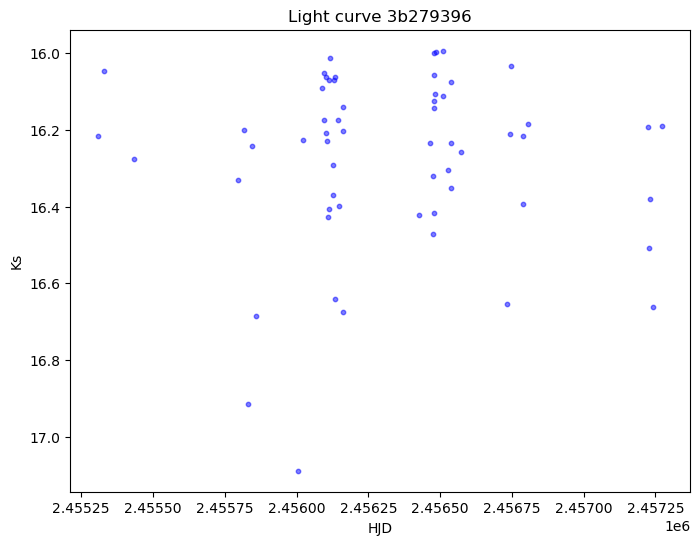

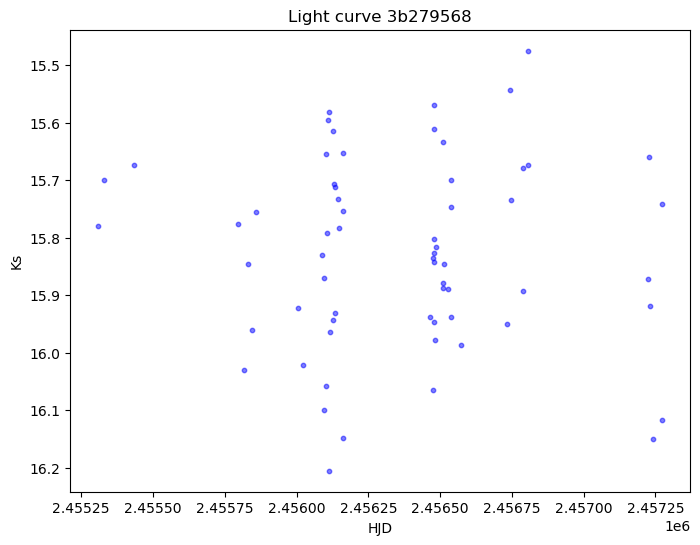

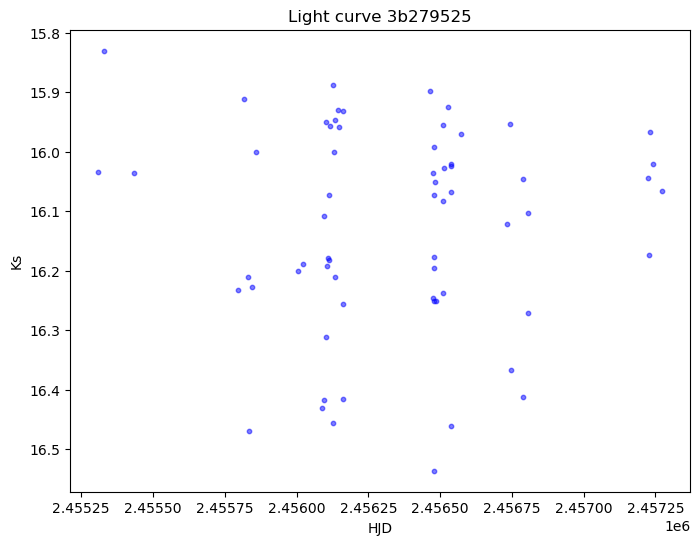

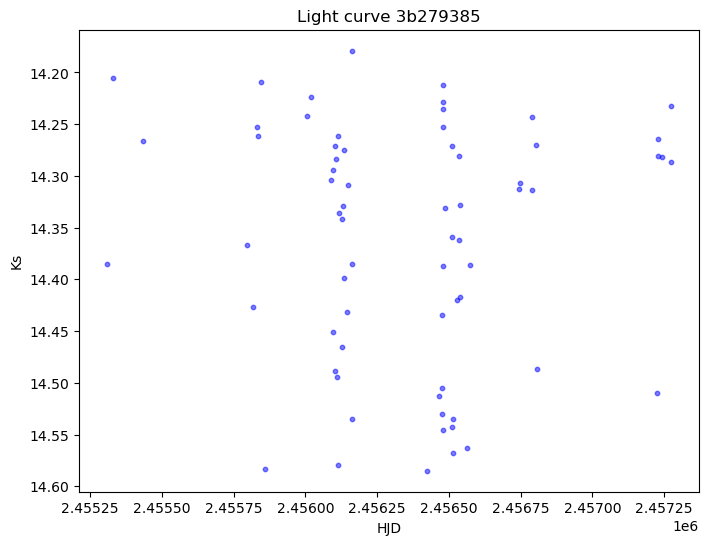

In [57]:
# Recorrer el diccionario y graficar las curvas de luz una por una
for clave, valor in grap79.items():
    flujos = valor[1]
    HJD = archivo5[1].data # Generar HJD aleatorios

  
    # Crear una nueva figura para cada curva de luz
    plt.figure(figsize=(8, 6))
    plt.scatter(HJD, flujos, s=10, c='blue', alpha=0.5)
    plt.xlabel('HJD')
    plt.ylabel('Ks')
    plt.gca().invert_yaxis()
    plt.title('Light curve ' + clave)
     
    # Guardar cada figura como una imagen separada
    plt.show()